# Initial Setup

In [1]:
#!pip install mogptk
!pip install darts

In [2]:
import sys
import os
!git clone https://github.com/a3i-2022-2023/04-rul
sys.path.append(os.getcwd() + "/04-rul")

fatal: destination path '04-rul' already exists and is not an empty directory.


In [3]:
from ordered_set import OrderedSet
import pandas as pd
from sklearn.compose import ColumnTransformer
import re
import matplotlib.pyplot as plt
import numpy as np
import notebooks.util.util as util

from sklearn.metrics import mean_squared_error

from sklearn.gaussian_process.kernels import RBF
from sklearn.gaussian_process import GaussianProcessRegressor

# Objectives

Given the top x games and their trand, we aim at:

- Predicting their trend in the near future in order to evaluate their "remaining useful life", predicting when interest may begin to fade, in order to forecast when to release update
- Fill missing values in order to complete a trend

# Dataset Analysis

In [4]:
# Get the dataset
df = pd.read_csv(os.getcwd() + "/Twitch_game_data.csv", encoding='cp1252')

The Dataset has:

- **Rank**

    For each month the ranking of the top 200 games
   
- **Game**

    The name of the videogame
    
- **Month**

    Int representing the month
   
- **Year**

     Int representing the year
     
- **Hours_watched**

    ??
   
- **Hours_Streamed**

    Total number of hours collectively streamed by all the channels that streamed that game 
    
- **Peak_viewers**

    Maximum number of viewers at one time that watched that game
   
- **Peak_channels**

     Maximum number of channels at one time that streamed that game
     
- **Streamers**

    Number of total streamers that streamed that game
   
- **Avg_viewers**

    ??
    
- **Avg_channels**

    ??
   
- **Avg_viewer_ratio**

    ??
    
     

In [5]:
# Quick glance at its structure
df

,Rank,Game,Month,Year,Hours_watched,Hours_Streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_viewer_ratio
0,1,League of Legends,1,2016,94377226,1362044 hours,530270,2903,129172,127021,1833,69.29
1,2,Counter-Strike: Global Offensive,1,2016,47832863,830105 hours,372654,2197,120849,64378,1117,57.62
2,3,Dota 2,1,2016,45185893,433397 hours,315083,1100,44074,60815,583,104.26
3,4,Hearthstone,1,2016,39936159,235903 hours,131357,517,36170,53749,317,169.29
4,5,Call of Duty: Black Ops III,1,2016,16153057,1151578 hours,71639,3620,214054,21740,1549,14.03
...,...,...,...,...,...,...,...,...,...,...,...,...
16995,196,Tom Clancy's The Division 2,1,2023,666943(118.3%),97138(59.5%),2759(49.9%),249(48.2%),12805(68.1%),897(118.2%),130(60.5%),6.87(36.9%)
16996,197,Persona 5 Royal,1,2023,664503(-2.9%),68310(2.7%),10494(19.6%),198(4.8%),7475(4.8%),894(-2.9%),91(2.2%),9.73(-5.4%)
16997,198,Bloodborne,1,2023,663078(59.1%),45522(31.8%),9455(30.4%),117(8.3%),8355(27.5%),892(59.3%),61(32.6%),14.57(20.7%)
16998,199,PowerWash Simulator,1,2023,657644(356.0%),18494(53.7%),63757(473.9%),192(346.5%),6589(42.3%),885(356.2%),24(50%),35.56(196.6%)


In [6]:
print("The dataset has", df.shape[0], "rows")

The dataset has 17000 rows


Immediately it's noticeable that:

- Month and Year can be merged in one single value Date which encapsulate the same concepte 
- Hours_Streamed is a string since it has the adjective hourse in its values, we have to clean this column and convert it to Int values to use it correctly
- Hours_watched, Hours_Streamed, Peak_viewers, Peak_channels, Streamers, Avg_viewers, Avg_channels and Avg_viewer_ratio all change format at one point in time, including also a percentage (which represent????). We have to format each of these column to their single Int value to use them correctly

But let's analyze a bit more our data

In [7]:
df.describe()

,Rank,Month,Year
count,17000.000000,17000.000000,17000.000000
mean,100.500000,6.435294,2019.047059
std,57.736003,3.482654,2.034504
min,1.000000,1.000000,2016.000000
25%,50.750000,3.000000,2017.000000
50%,100.500000,6.000000,2019.000000
75%,150.250000,9.000000,2021.000000
max,200.000000,12.000000,2023.000000


In [8]:
df.dtypes

Rank                 int64
Game                object
Month                int64
Year                 int64
Hours_watched       object
Hours_Streamed      object
Peak_viewers        object
Peak_channels       object
Streamers           object
Avg_viewers         object
Avg_channels        object
Avg_viewer_ratio    object
dtype: object

In [9]:
print("Number of unique games in the dataset:",len(list(df["Game"].unique())))

Number of unique games in the dataset: 2003


# Dataset cleaning

## Clean and change format of each object column with values

In [10]:
# Get the number in the string
def getNumber(x):
    return int(re.match("\d+", x).group())

In [11]:
df.rename(columns={"Hours_Streamed": "Hours_streamed"}, inplace=True)

In [12]:
columns_to_convert = ['Hours_watched', 'Hours_streamed', 'Peak_viewers', 'Peak_channels', 'Streamers', 'Avg_viewers', 'Avg_channels', 'Avg_viewer_ratio']

In [13]:
for column_name in columns_to_convert:
    df[column_name] = df[column_name].map(lambda x: getNumber(x))

In [14]:
df

,Rank,Game,Month,Year,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_viewer_ratio
0,1,League of Legends,1,2016,94377226,1362044,530270,2903,129172,127021,1833,69
1,2,Counter-Strike: Global Offensive,1,2016,47832863,830105,372654,2197,120849,64378,1117,57
2,3,Dota 2,1,2016,45185893,433397,315083,1100,44074,60815,583,104
3,4,Hearthstone,1,2016,39936159,235903,131357,517,36170,53749,317,169
4,5,Call of Duty: Black Ops III,1,2016,16153057,1151578,71639,3620,214054,21740,1549,14
...,...,...,...,...,...,...,...,...,...,...,...,...
16995,196,Tom Clancy's The Division 2,1,2023,666943,97138,2759,249,12805,897,130,6
16996,197,Persona 5 Royal,1,2023,664503,68310,10494,198,7475,894,91,9
16997,198,Bloodborne,1,2023,663078,45522,9455,117,8355,892,61,14
16998,199,PowerWash Simulator,1,2023,657644,18494,63757,192,6589,885,24,35


In [15]:
df.dtypes

Rank                 int64
Game                object
Month                int64
Year                 int64
Hours_watched        int64
Hours_streamed       int64
Peak_viewers         int64
Peak_channels        int64
Streamers            int64
Avg_viewers          int64
Avg_channels         int64
Avg_viewer_ratio     int64
dtype: object

## Check for NaN values in the dataset

In [16]:
df.isnull().sum()

Rank                0
Game                1
Month               0
Year                0
Hours_watched       0
Hours_streamed      0
Peak_viewers        0
Peak_channels       0
Streamers           0
Avg_viewers         0
Avg_channels        0
Avg_viewer_ratio    0
dtype: int64

In [17]:
df[df['Game'].isna()]

,Rank,Game,Month,Year,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_viewer_ratio
7561,162,NaN,2,2019,317951,77004,30919,5804,21758,473,114,4


Since there is only one game name with it's name missing, we can't draw any conclusion on what game it might be, so we decided to drop it.

(can we do something with it?)

In [18]:
df = df.dropna()

In [19]:
df[df['Game'].isna()]

,Rank,Game,Month,Year,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_viewer_ratio


## Merge Month and Year in Date

In [20]:
# Create merged unique date representation
df['Date'] = df.apply(lambda row: pd.to_datetime(str(row['Month']) + str(row['Year']),format='%m%Y'), axis=1)
del df['Month']
del df['Year']

C:\Users\Enri\AppData\Local\Temp/ipykernel_17396/2908505859.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date'] = df.apply(lambda row: pd.to_datetime(str(row['Month']) + str(row['Year']),format='%m%Y'), axis=1)


In [21]:
# with pd.option_context('display.max_rows', None,
#                        'display.max_columns', None,
#                        'display.precision', 3,
#                      ):
#     print(len(tmp))
# 
#lol, Counter-Strike: Global Offensive, Hearthstone, 

## Check for duplicates

In [22]:
duplicates = df[df.duplicated()]
duplicates 

,Rank,Game,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_viewer_ratio,Date


We do not have any duplicates, but this information alone is not very useful.

Since we have a lot of different values, an exact copy of a row was very unlikely, and fortunately we did not have any row duplicates.

But we still could have duplicates of the same game in the same date but with differen measurements, due to some mistake in the data gathering process.

In [23]:
duplicates = df[df[['Game','Date']].duplicated(keep=False)]
duplicates 

,Rank,Game,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_viewer_ratio,Date
1915,116,Resident Evil,251183,3976,9871,21,7420,338,5,63,2016-10-01
1979,180,Resident Evil,143542,4113,9577,31,1047,193,5,34,2016-10-01
6474,75,Dungeons & Dragons,790966,21961,38597,181,2876,1100,30,36,2018-09-01
6502,103,Dungeons & Dragons,550645,10198,40261,127,2091,765,14,54,2018-09-01
7212,13,Resident Evil 2,16394917,449333,314244,6488,70644,22065,604,36,2019-01-01
7214,15,Atlas,12110031,187032,69614,637,10070,16298,251,64,2019-01-01
7249,50,Atlas,2106560,23485,75774,728,3909,2835,31,89,2019-01-01
7329,130,Resident Evil 2,578746,16569,38429,285,5441,778,22,34,2019-01-01
13671,72,Retro,2976840,131077,20554,424,8577,4140,182,22,2021-09-01
13719,120,Retro,1511016,56192,23532,329,6430,2101,78,26,2021-09-01


As we can see, due to some mistake, some games were introduced with different values but in the same date.
We can:
- Drop both values (this)
- Average of the values
- ???

In [24]:
df_no_duplicates = df.drop_duplicates(subset=['Game', 'Date'],keep=False)

In [25]:
print("We removed a total of", df.shape[0] - df_no_duplicates.shape[0], "duplicate rows")

We removed a total of 16 duplicate rows


# Create a subset of the most streamed games in the whole dataset

To obtain the most streamed games in our whole dataset we used a threshold which limits the games that were present more than 70 times.

Since our dataset is focused on the month starting from 2016 to 2022, we will have a total of 84 maximum times a game can be present in our dataset (12 month * 7 years).

In [26]:
# Get the top games
#for name in list(df_no_duplicates["Game"].unique()):
#    if(len(df_no_duplicates[df_no_duplicates['Game'] == name]) >= value_threshold):
#        always_on_top.append(name)

Now we can create the subset of our dataset

In [27]:
# games_dict = {}
# df_allDates = pd.DataFrame(pd.date_range(df_reduced["Date"].min(), df_reduced["Date"].max(), freq='MS'), columns =['Date'])
# for game in df_reduced['Game'].unique():
#     df_allDates = pd.DataFrame(pd.date_range(df_reduced["Date"].min(), df_reduced["Date"].max(), freq='MS'), columns =['Date'])
#     df_temp = 

Since we want a continuous dataset that has measurements for each month and for each game in all the analyzed years, we need to modify the dataframe inserting NaN values in case a game was not present in that month.

In [28]:
df_allDates = pd.DataFrame(pd.date_range(df_no_duplicates["Date"].min(), df_no_duplicates["Date"].max(), freq='MS'), columns =['Date'])
df_names = pd.DataFrame(df_no_duplicates['Game'].unique(), columns = ['Game'])
df_names = df_names.merge(df_allDates, how='cross')
df_clean = df_names.merge(df_no_duplicates, how="left")
df_clean

,Game,Date,Rank,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_viewer_ratio
0,League of Legends,2016-01-01,1.0,94377226.0,1362044.0,530270.0,2903.0,129172.0,127021.0,1833.0,69.0
1,League of Legends,2016-02-01,1.0,93154772.0,1266715.0,475784.0,2712.0,117996.0,134035.0,1822.0,73.0
2,League of Legends,2016-03-01,1.0,94514511.0,1264029.0,599114.0,2585.0,117734.0,127206.0,1701.0,74.0
3,League of Legends,2016-04-01,1.0,88389049.0,1217250.0,553165.0,2945.0,113251.0,122933.0,1692.0,72.0
4,League of Legends,2016-05-01,1.0,80679320.0,1196096.0,433005.0,2635.0,118593.0,108585.0,1609.0,67.0
...,...,...,...,...,...,...,...,...,...,...,...
170165,Uno,2022-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
170166,Uno,2022-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
170167,Uno,2022-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
170168,Uno,2022-12-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Total amount of rows with missing values

In [29]:
df_clean['Rank'].isna().sum()

153187

We can see that we correctly managed to insert NaN columns.

In [30]:
print("Example of an inserted row:\n")
df_clean.iloc[84]

Example of an inserted row:



Game                  League of Legends
Date                2023-01-01 00:00:00
Rank                                2.0
Hours_watched               126494155.0
Hours_streamed                2363972.0
Peak_viewers                   640837.0
Peak_channels                    6356.0
Streamers                      231482.0
Avg_viewers                    170247.0
Avg_channels                     3181.0
Avg_viewer_ratio                   53.0
Name: 84, dtype: object

Now we can sort the dataset.

In [31]:
# Sort by game and then by date (ty garfield)
df_clean = df_clean.sort_values(by=['Game', 'Date'], ascending=True).reset_index(drop=True)
df_clean

,Game,Date,Rank,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_viewer_ratio
0,.hack//G.U. Last Recode,2016-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,.hack//G.U. Last Recode,2016-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,.hack//G.U. Last Recode,2016-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,.hack//G.U. Last Recode,2016-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,.hack//G.U. Last Recode,2016-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
170165,theHunter: Call of the Wild,2022-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
170166,theHunter: Call of the Wild,2022-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
170167,theHunter: Call of the Wild,2022-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
170168,theHunter: Call of the Wild,2022-12-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
def plot_series(df, feature_name:str, fig=None, ax=None, figsize=(20,8), show_sample_range=False, show_missing_range=False, show_sample_points=False, plot_img=True):
    # Plot feature_name trend
    if ax is None: 
        fig, ax = plt.subplots(figsize=figsize)
        
    ax.plot(df['Date'].unique(), df[feature_name], color="blue", label = feature_name)

    game_name = df['Game'].unique()[0]
    plt.title(f'{feature_name} for {game_name}')
    
    if show_sample_range:
        line_points = df[feature_name].where(df[feature_name].isna(), 0)
        ax.plot(df['Date'].unique(), line_points, color="forestgreen")
    
    if show_missing_range:
        line_points = df[feature_name].where(df[feature_name].isna(), 0)
        not_line_points = line_points.apply(lambda x: np.NaN if not np.isnan(x) else 0)
        if plot_img:
            label='missing values'
        else: label=None
        ax.scatter(df['Date'].unique(), not_line_points, color="r", label=label)
        
    if show_sample_points:
        if plot_img:
            label='observations'
        else: label=None
        ax.scatter(df['Date'].unique(), df[feature_name], color="purple", marker='x', label=label)
        
    plt.legend()
    if plot_img:
        plt.plot()
    return fig, ax

In [33]:
np.NaN == np.NaN # Da tenere perchè si.

False

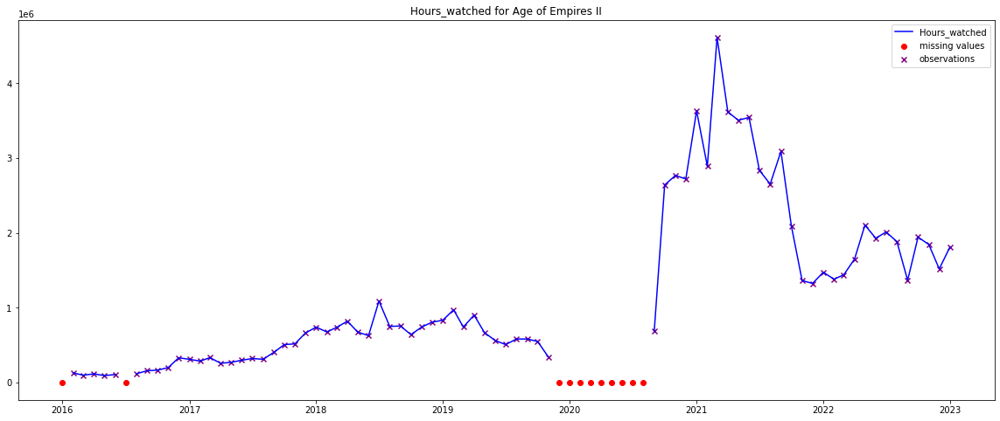

In [34]:
tmp = df_clean[df_clean['Game'] == "Age of Empires II"]
fig, ax = plot_series(df=tmp, feature_name="Hours_watched", show_missing_range = True, show_sample_points=True, plot_img=True)

We consider only `[Hours_watched, Hours_Streamed, Peak_viewers]` for prediction of values.

In [35]:
df_clean.corr()

C:\Users\Enri\AppData\Local\Temp/ipykernel_17396/1863484124.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_clean.corr()


,Rank,Hours_watched,Hours_streamed,Peak_viewers,Peak_channels,Streamers,Avg_viewers,Avg_channels,Avg_viewer_ratio
Rank,1.000000,-0.395769,-0.380141,-0.361592,-0.279556,-0.374547,-0.395753,-0.380222,0.061742
Hours_watched,-0.395769,1.000000,0.752450,0.706356,0.504506,0.741857,0.999586,0.752269,-0.014851
Hours_streamed,-0.380141,0.752450,1.000000,0.558273,0.769005,0.937792,0.752063,0.999572,-0.042215
Peak_viewers,-0.361592,0.706356,0.558273,1.000000,0.516130,0.563618,0.706073,0.558318,0.051956
Peak_channels,-0.279556,0.504506,0.769005,0.516130,1.000000,0.713882,0.505017,0.769889,-0.030282
Streamers,-0.374547,0.741857,0.937792,0.563618,0.713882,1.000000,0.741778,0.937724,-0.044716
Avg_viewers,-0.395753,0.999586,0.752063,0.706073,0.505017,0.741778,1.000000,0.752538,-0.014876
Avg_channels,-0.380222,0.752269,0.999572,0.558318,0.769889,0.937724,0.752538,1.000000,-0.042194
Avg_viewer_ratio,0.061742,-0.014851,-0.042215,0.051956,-0.030282,-0.044716,-0.014876,-0.042194,1.000000


In [36]:
#for game_name in always_on_top:
#    tmp = df_clean[df_clean['Game'] == game_name]
#    plot_series(df=tmp, feature_name="Hours_watched", show_missing_range = True, show_sample_points=True)

In [37]:
date_separation = pd.Timestamp(year=2021, month=12, day=31, hour=0)
print(date_separation)

2021-12-31 00:00:00


In [38]:
# List of top streamed games "ever"
games_train = []
games_test = []
games_val = []

# Threshold which represent the times a game is present in the dataset
nan_threshold_train = 12
nan_threshold_test = 0
# how many games in validation
n_games_val = 30

# Get the top games
for name in list(df_clean["Game"].unique()):
    is_before_date = df_clean["Date"] <= date_separation
    is_same_name = df_clean['Game'] == name
    #condition = is_before_date & is_same_name
    if (df_clean['Rank'][is_before_date & is_same_name].isna().sum() <= nan_threshold_train):
        games_train.append(name)
    if (df_clean['Rank'][~is_before_date & is_same_name].isna().sum() <= nan_threshold_test):
        games_test.append(name)


print("Training: A total of", len(games_train), "games had at most", nan_threshold_train, "missing values before the test date.")
print("Test: A total of", len(games_test), "games had at most", nan_threshold_test, "missing values after the test date.")
#df_reduced = df_no_duplicates[df_no_duplicates['Game'].isin(always_on_top)].copy()
# why: we want some history also for the test games
games_test = OrderedSet(games_test).intersection(OrderedSet(games_train))
np.random.seed(42)
games_val = np.random.choice(list(games_test), size=n_games_val, replace=False).tolist()
games_test = list(games_test.difference(OrderedSet(games_val)))

games_train.sort(), games_val.sort(), games_test.sort()
games_train, games_val, games_test

Training: A total of 61 games had at most 12 missing values before the test date.
Test: A total of 108 games had at most 0 missing values after the test date.


(['7 Days to Die',
  'ARK: Survival Evolved',
  'Age of Empires II',
  'Black Desert Online',
  'Bloodborne',
  'Chess',
  'Clash Royale',
  'Counter-Strike: Global Offensive',
  'Dark Souls',
  'Dark Souls III',
  'DayZ',
  'Dead by Daylight',
  'Diablo III',
  'Dota 2',
  'Dungeons & Dragons',
  'Euro Truck Simulator 2',
  'Games + Demos',
  'Grand Theft Auto V',
  'Guild Wars 2',
  'Gwent: The Witcher Card Game',
  'Hearthstone',
  'Heroes of the Storm',
  'League of Legends',
  'Magic: The Gathering',
  'MapleStory',
  'Mario Kart 8',
  'Minecraft',
  'Music',
  'Overwatch',
  'Paladins',
  'Path of Exile',
  'Poker',
  'Retro',
  'RimWorld',
  'Roblox',
  'Rocket League',
  'RuneScape',
  'Rust',
  'SMITE',
  'Star Citizen',
  'StarCraft II',
  'Stardew Valley',
  'Street Fighter V',
  'Summoners War: Sky Arena',
  'Super Mario 64',
  'Super Smash Bros. Melee',
  'Talk Shows & Podcasts',
  'Terraria',
  'The Elder Scrolls Online',
  'The Elder Scrolls V: Skyrim',
  'The Legend of 

We use data up to the end of 2021 to predict the evolution of streaming data up to Jan 2023.

In [39]:
df_subfeatures = df_clean.drop(columns=[col for col in df_clean.columns if col not in ["Game","Date", "Hours_watched", "Hours_streamed", "Peak_viewers"]])

In [40]:
is_train = (df_subfeatures["Date"] <= date_separation) & (df_subfeatures["Game"].isin(games_train))
is_val = (df_subfeatures["Date"] > date_separation) & (df_subfeatures["Game"].isin(games_val))
is_test = (df_subfeatures["Date"] > date_separation) & (df_subfeatures["Game"].isin(games_test))

df_train = df_subfeatures[is_train]
df_val = df_subfeatures[is_val]
df_test = df_subfeatures[is_test]

In [41]:
len(df_test['Game'].unique())

15

## Feature selection

We keep Game, Date, Hours_watched, Hours_streamed, Peak_viewers

## Filling missing values

We compare different methods for filling missing values, and choose one based on RMSE (?)

1. artificially remove some more samples (10% of 84?) for each game and for each feature we predict
2. apply filling method
3. compute RMSE or the other metric and take the mean across everything
4. observe results, take the best one and comment on why?

In [42]:
features = ["Hours_watched", "Hours_streamed", "Peak_viewers"]
game_name = "Age of Empires II"
size_mv = 15
figsize = (15, 5)
dates_count = len(df_train['Date'].unique())

In [43]:
df_train[features].corr()

,Hours_watched,Hours_streamed,Peak_viewers
Hours_watched,1.000000,0.863098,0.813512
Hours_streamed,0.863098,1.000000,0.708116
Peak_viewers,0.813512,0.708116,1.000000


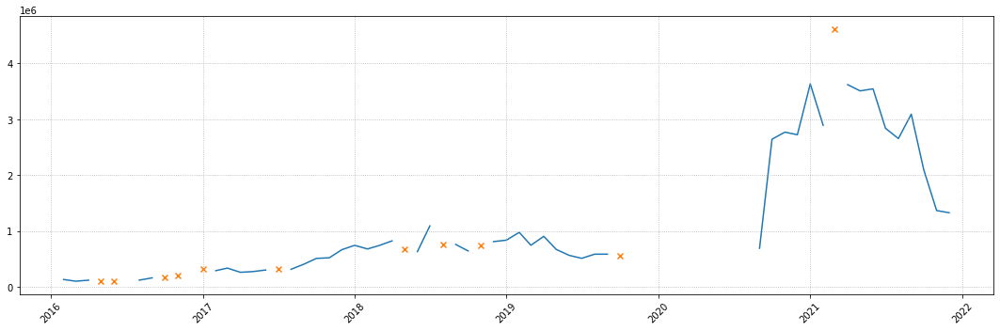

In [44]:
np.random.seed(42) # seed (to get reproducible results)
ddata = df_train[df_train["Game"] == game_name].set_index(keys="Date", drop=True)["Hours_watched"]
mv_idx = np.random.choice(range(len(ddata.index)), size=size_mv, replace=False) # avoid ffill on first element and bfill on last
ddata_mv = ddata.copy()
ddata_mv.iloc[mv_idx] = np.NaN
util.plot_series(ddata_mv, figsize=figsize)
plt.scatter(ddata.index[mv_idx], ddata.iloc[mv_idx], color='tab:orange', marker='x');

In [45]:
nan_mask = ddata.isnull()
ffseries = ddata_mv.fillna(method='ffill').fillna(method='bfill')
ffseries[nan_mask] = np.NaN # We empty the values that were originally empty
bfseries = ddata_mv.fillna(method='bfill').fillna(method='ffill')
bfseries[nan_mask] = np.NaN # We empty the values that were originally empty

rmse_ff = np.sqrt(mean_squared_error(ddata[~nan_mask], ffseries[~nan_mask]))
rmse_bf = np.sqrt(mean_squared_error(ddata[~nan_mask], bfseries[~nan_mask]))
print(f'RMSE for forwad filling: {rmse_ff:.2f}, for backward filling {rmse_bf:.2f}')

RMSE for forwad filling: 226282.86, for backward filling 133616.74


In [46]:
#util.plot_series(ffseries, figsize=figsize)
#plt.scatter(ddata.index[mv_idx], ddata.iloc[mv_idx], color='tab:orange', marker='x');
#plt.scatter(ddata.index[mv_idx], ffseries.iloc[mv_idx], color='tab:red', marker='x');

In [47]:
#util.plot_series(bfseries, figsize=figsize)
#plt.scatter(ddata.index[mv_idx], ddata.iloc[mv_idx], color='tab:orange', marker='x');
#plt.scatter(ddata.index[mv_idx], bfseries.iloc[mv_idx], color='tab:red', marker='x');

In [48]:
import warnings
warnings.filterwarnings("default")

We try those methods and compute the mean RMSE among games and columns [hours watched, hours streamed, peak viewers].
We normalize the values between

In [49]:
from sklearn.gaussian_process.kernels import ExpSineSquared, RationalQuadratic, WhiteKernel
def fill_gp(ddata_mv, kernel=None):
    if kernel is None: 
        kernel = RationalQuadratic(length_scale=1.0, alpha=1.5)
    # save date index
    old_index = ddata_mv.index
    # convert to numeric index for gp fit
    ddata_mv = ddata_mv.reset_index(drop=True)
    nan_mask_mv = ddata_mv.isna()
    
    #kernel = RBF(1, (1e-2, 1e2))
    gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=9, normalize_y=True, random_state = 42)
    gp.fit(X=ddata_mv[~nan_mask_mv].index.values.reshape(-1,1), y=ddata_mv[~nan_mask_mv].values) # needs 2D input (pass samples)
    
    
    #print("kernel params:", gp.kernel.get_params())
    
    xp, std = gp.predict(ddata_mv.index.values.reshape(-1,1), return_std=True)
    xp = pd.Series(index=ddata_mv.index, data=xp)
    std = pd.Series(index=ddata_mv.index, data=std)
    
    # take as predictions the mean values 
    preds = xp
    preds.index = old_index
    return preds

In [50]:
# fix the dates in which to drop observations
mv_idx = np.random.choice(range(dates_count), size=size_mv, replace=False)

We test different filling methods to see which is best, based on RMSE. Since we remove some observations, we include also the games that have no missing values to have more samples in our experiments.

In [51]:
kernel_1 = RBF(1, (1e-2, 1e2))
kernel_2 = RationalQuadratic(length_scale=1.0, alpha=1.5)
kernel_3 = ExpSineSquared(length_scale=1, periodicity=1) + WhiteKernel(noise_level=0.5)
kernel_4 = RationalQuadratic(length_scale=1.0, alpha=1.5) + WhiteKernel(noise_level=0.5)

args = [{'method':'ffill'}, {'method':'bfill'}, {'method':'linear'}, {'method':'nearest'},
        {'method':'polynomial', 'order': 2}, {'method':'spline', 'order': 4},
        {'method': 'GPR_1', 'kernel': kernel_1}, 
        {'method': 'GPR_2', 'kernel': kernel_2},
        {'method': 'GPR_3', 'kernel': kernel_3},
        {'method': 'GPR_4', 'kernel': kernel_4}]

fill_avg_rmse = dict(zip([x['method'] for x in args], [0]*len(args)))
method_for_feature = dict(zip(features, [None]*len(features)))


for feature in features:
        for game_name in df_train["Game"].unique():
                # if it has no missing values, we do not compute anything
                
                # get the timeseries for the game and feature
                ddata = df_train[df_train["Game"] == game_name].set_index(keys="Date", drop=True)[feature]
                # remember which values were already nan
                nan_mask = ddata.isnull()
                # remove the observations
                ddata_mv = ddata.copy()
                ddata_mv.iloc[mv_idx] = np.NaN
                
                filling_res = {}
                for a in args:
                        if 'GPR' in a['method']:
                                filling_res[a['method']] = fill_gp(ddata_mv=ddata_mv, kernel=a['kernel'])
                        else:
                                filling_res[a['method']] = ddata_mv.interpolate(**a)
                                if filling_res[a['method']].isna().sum() > 0:
                                        filling_res[a['method']] = filling_res[a['method']].fillna(method='ffill').fillna(method='bfill')
                                        
                        rmse = np.sqrt(mean_squared_error(ddata[~nan_mask], filling_res[a['method']][~nan_mask]))
                        #print(f'RMSE for {a["method"]} on game {game_name} feature {feature}: {rmse:.2f}')
                        fill_avg_rmse[a['method']] += rmse

        for a in args:
                fill_avg_rmse[a['method']] /= len(df_train["Game"].unique())
        print(f"Average RMSE for method on feature {feature}:\n{fill_avg_rmse}")

        fill_method = min(fill_avg_rmse, key=fill_avg_rmse.get)
        fill_method = [a for a in args if a["method"] == fill_method][0]
        method_for_feature[feature] = fill_method
        print(f"Best method for feature {feature}: {fill_method}")   

d:\Anaconda\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sk

Average RMSE for method on feature Hours_watched:
{'ffill': 1387473.7971445592, 'bfill': 1375784.9389362116, 'linear': 1162634.9937006345, 'nearest': 1422576.4007416093, 'polynomial': 1301909.110890549, 'spline': 5740900.39823063, 'GPR_1': 1260272.4620347985, 'GPR_2': 1099952.3549330006, 'GPR_3': 1782158.536681029, 'GPR_4': 1365309.6107727757}
Best method for feature Hours_watched: {'method': 'GPR_2', 'kernel': RationalQuadratic(alpha=1.5, length_scale=1)}


d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of

Average RMSE for method on feature Hours_streamed:
{'ffill': 39244.32807052031, 'bfill': 38839.03495812856, 'linear': 31093.752334375753, 'nearest': 39907.69268991318, 'polynomial': 34408.25171932382, 'spline': 153550.4564261362, 'GPR_1': 38252.51735309671, 'GPR_2': 30740.398145948253, 'GPR_3': 60379.75550332816, 'GPR_4': 42414.57753154315}
Best method for feature Hours_streamed: {'method': 'GPR_2', 'kernel': RationalQuadratic(alpha=1.5, length_scale=1)}


d:\Anaconda\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 0.01. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\skl

Average RMSE for method on feature Peak_viewers:
{'ffill': 32747.5157143664, 'bfill': 35201.10580793731, 'linear': 29951.26976597801, 'nearest': 33618.95673455762, 'polynomial': 34241.94437310379, 'spline': 171644.4972535008, 'GPR_1': 25628.13884420266, 'GPR_2': 24183.916123165705, 'GPR_3': 38134.22363697619, 'GPR_4': 27779.617398826493}
Best method for feature Peak_viewers: {'method': 'GPR_2', 'kernel': RationalQuadratic(alpha=1.5, length_scale=1)}


In [52]:
df_stat_nan = df_train['Hours_watched'].isnull().groupby(df_train['Game']).sum().reset_index(name='count')
#print(df_stat_nan)
# how many games have no missing values
df_stat_nan[df_stat_nan['count']== 0].count()
# which games do not need to be filled
games_to_fill = df_stat_nan[df_stat_nan['count'] != 0]['Game'].unique()
print(f'{len(games_to_fill)} have missing values.\n Games: {games_to_fill}')

28 have missing values.
 Games: ['ARK: Survival Evolved' 'Age of Empires II' 'Black Desert Online'
 'Bloodborne' 'Chess' 'Clash Royale' 'Dark Souls III' 'Dead by Daylight'
 'Diablo III' 'Dungeons & Dragons' 'Games + Demos' 'Guild Wars 2'
 'Gwent: The Witcher Card Game' 'MapleStory' 'Mario Kart 8' 'Overwatch'
 'Paladins' 'Retro' 'RimWorld' 'Roblox' 'RuneScape' 'Star Citizen'
 'Stardew Valley' 'Super Smash Bros. Melee' 'Terraria'
 'The Elder Scrolls V: Skyrim' 'The Legend of Zelda: Ocarina of Time'
 'The Witcher 3: Wild Hunt']


In [54]:
df_train_filled = df_train.copy()

for feature in features:
    print(f"Applying {method_for_feature[feature]} filling to {feature}")
    for game_name in games_to_fill:
        
        ddata = df_train[df_train["Game"] == game_name].set_index(keys="Date", drop=True)[feature]
        #print('BEFORE', ddata.isna().sum())
        if 'GPR' in method_for_feature[feature]['method']:
            filled = fill_gp(ddata_mv=ddata, kernel=method_for_feature[feature]['kernel'])
        else:
            filled = ddata.interpolate(**method_for_feature[feature]).fillna(method='ffill').fillna(method='bfill')

        df_train_filled.loc[df_train_filled["Game"] == game_name, feature] = filled.values
    
            #print(len(df_train_filled[feature]))
    #assert(df_train_filled[feature].isna().sum()==0)

Applying {'method': 'GPR_2', 'kernel': RationalQuadratic(alpha=1.5, length_scale=1)} filling to Hours_watched


d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter alp

Applying {'method': 'GPR_2', 'kernel': RationalQuadratic(alpha=1.5, length_scale=1)} filling to Hours_streamed


d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Applying {'method': 'GPR_2', 'kernel': RationalQuadratic(alpha=1.5, length_scale=1)} filling to Peak_viewers


d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
d:\Anaconda\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter len

In [55]:
df_train_filled.isna().sum()

Game              0
Date              0
Hours_watched     0
Hours_streamed    0
Peak_viewers      0
dtype: int64

In case the previous filling produce negative values, we discard those values and forward fill.
Other options could have been to clip at 0 or at 1, being the first physically possible value that those streaming features can take, but since we will later use log scale normalization, this avoids numerical errors, and also avoids outliers that are too big.

In [56]:
for feature in features:
    df_train_filled.loc[df_train_filled[feature] <0 , feature] = np.NaN
    df_train_filled.ffill(inplace=True)
df_train_filled.loc[df_train_filled['Hours_streamed'].isna()]

,Game,Date,Hours_watched,Hours_streamed,Peak_viewers


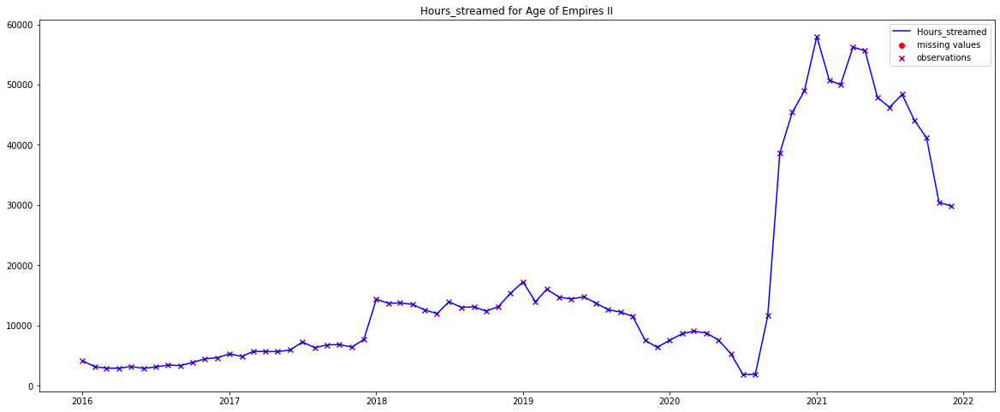

In [57]:
tmp = df_train_filled[df_train_filled['Game'] == "Age of Empires II"]
#tmp = get_ts(df_train_filled, game=0)
plot_series(df=tmp, feature_name="Hours_streamed", show_missing_range=True, show_sample_points=True);

## Prints of filled timeseries

C:\Users\Enri\AppData\Local\Temp/ipykernel_17396/3415311759.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


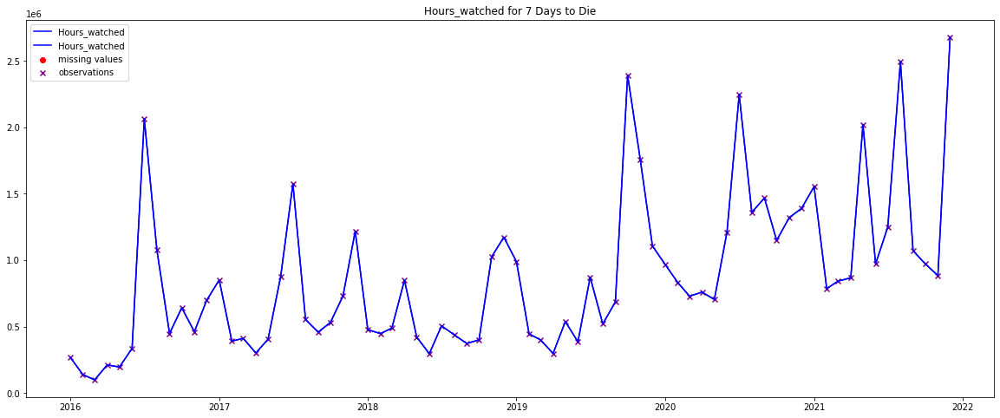

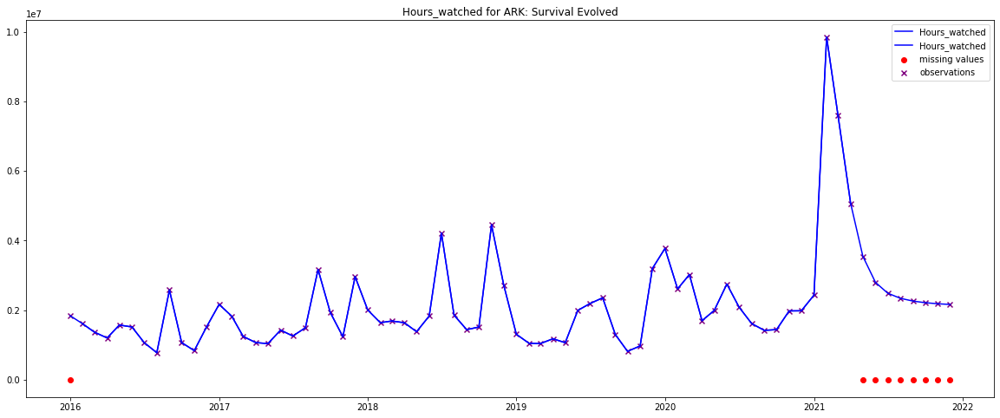

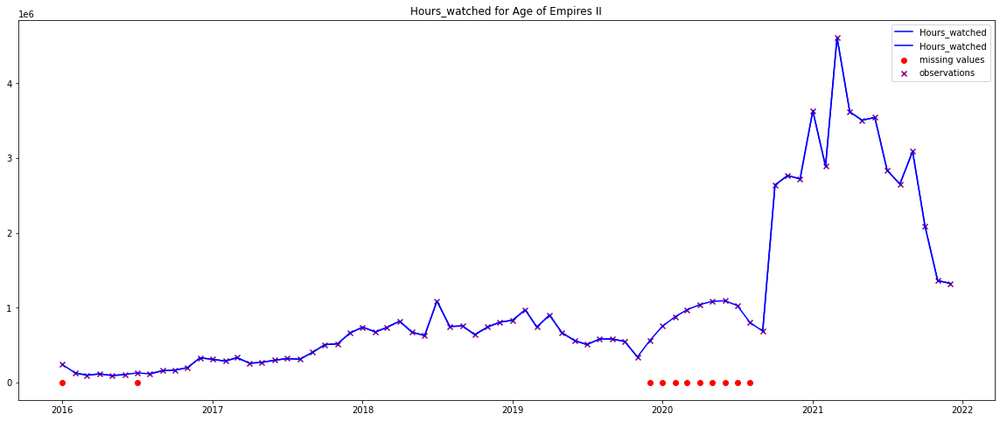

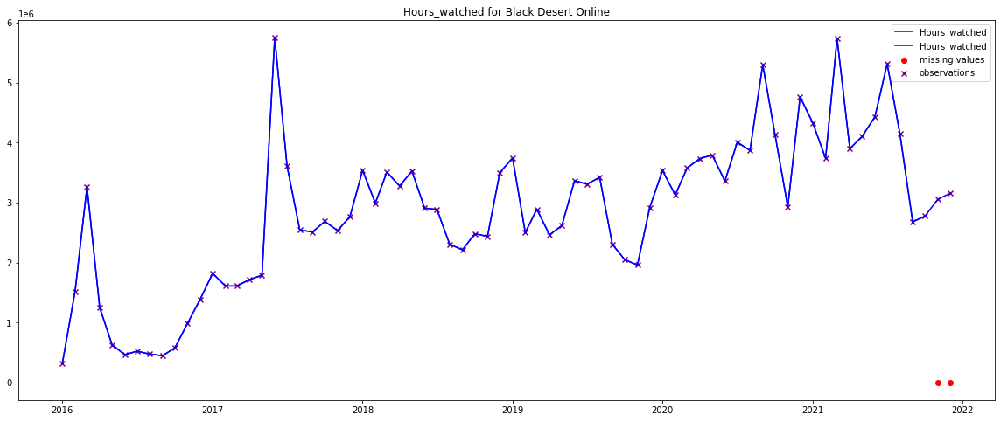

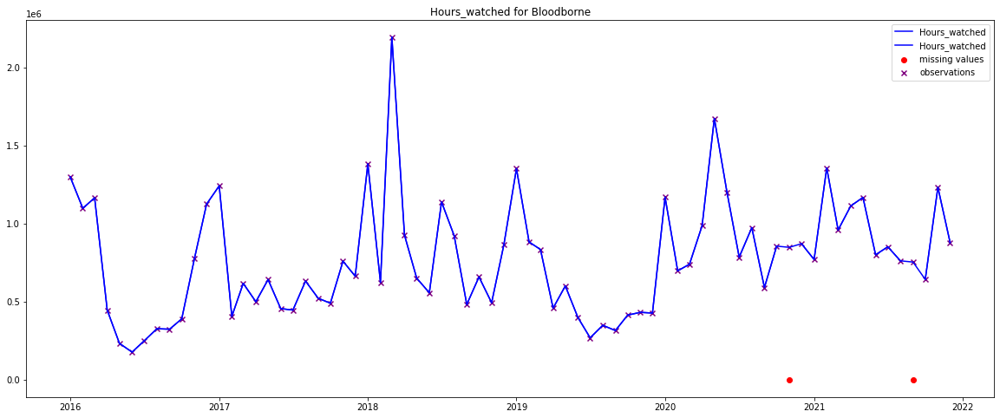

...

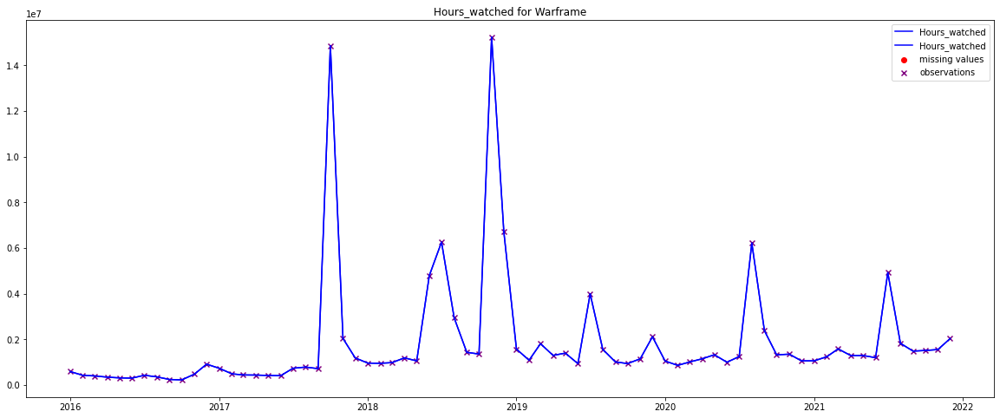

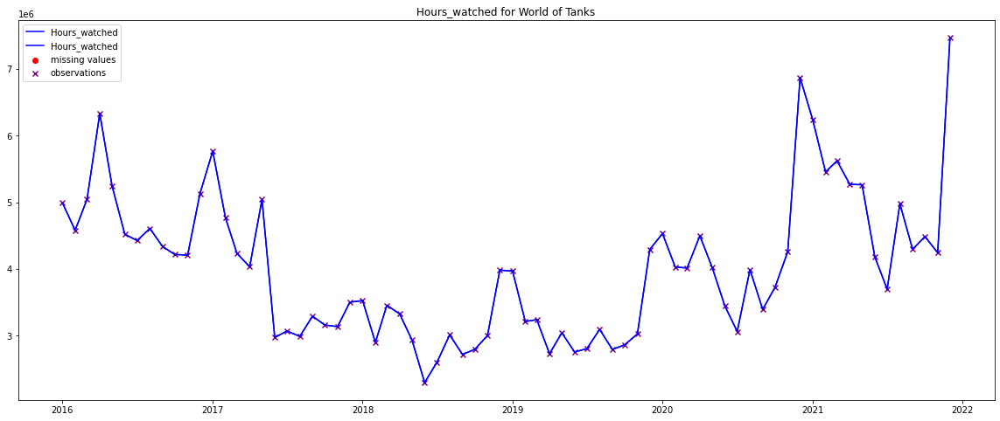

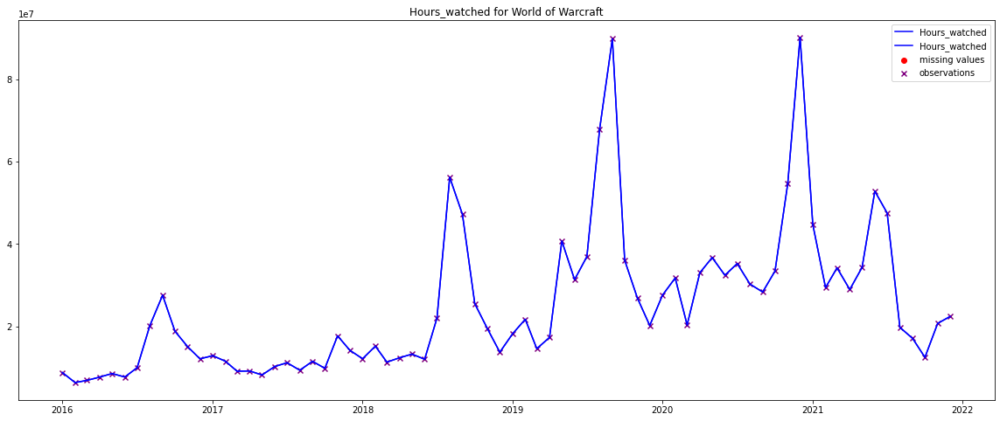

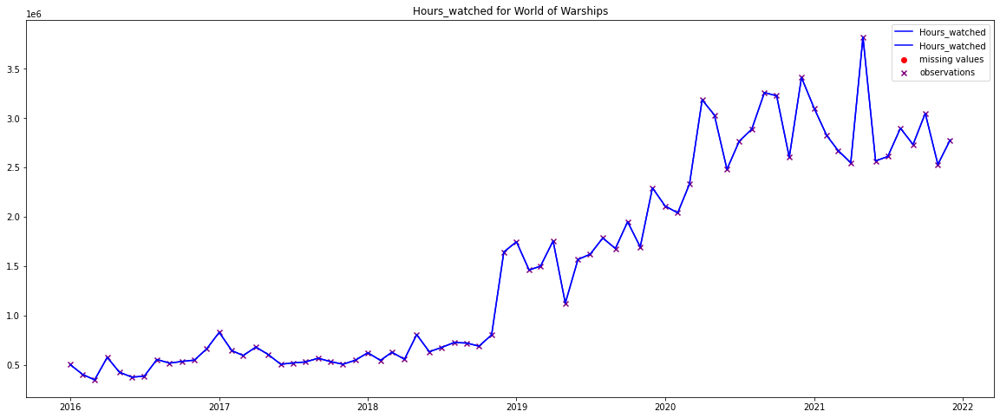

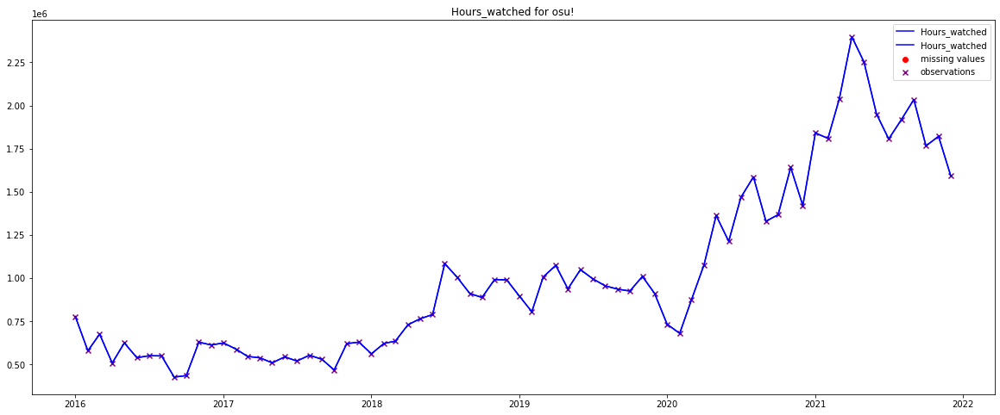

In [58]:
for game_name in df_train_filled['Game'].unique():
    tmp = df_train[df_train['Game'] == game_name]
    fig, ax = plot_series(df=tmp, feature_name="Hours_watched", show_missing_range = True, plot_img=False)
    tmp = df_train_filled[df_train_filled['Game'] == game_name]
    plot_series(df=tmp, feature_name="Hours_watched", ax=ax, show_sample_points=True, show_missing_range = True, plot_img=True);

C:\Users\Enri\AppData\Local\Temp/ipykernel_17396/3415311759.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


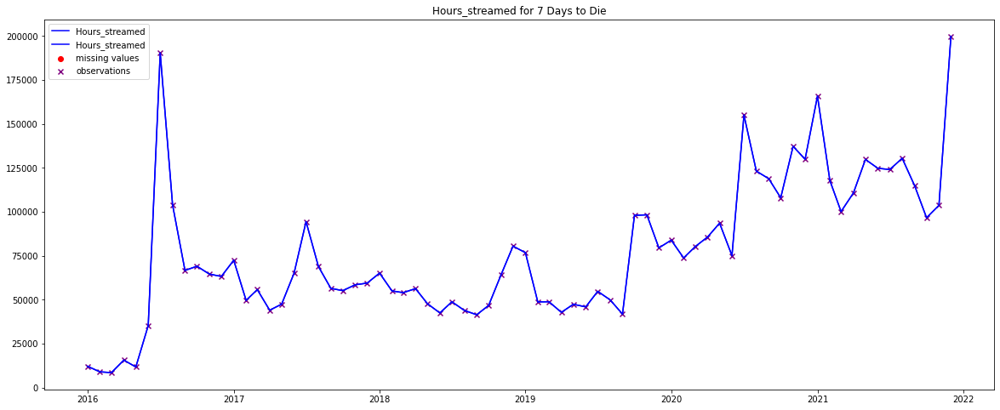

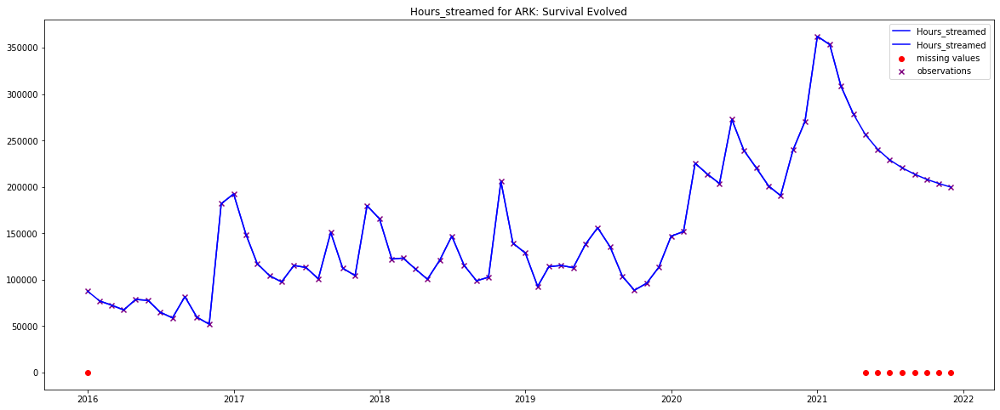

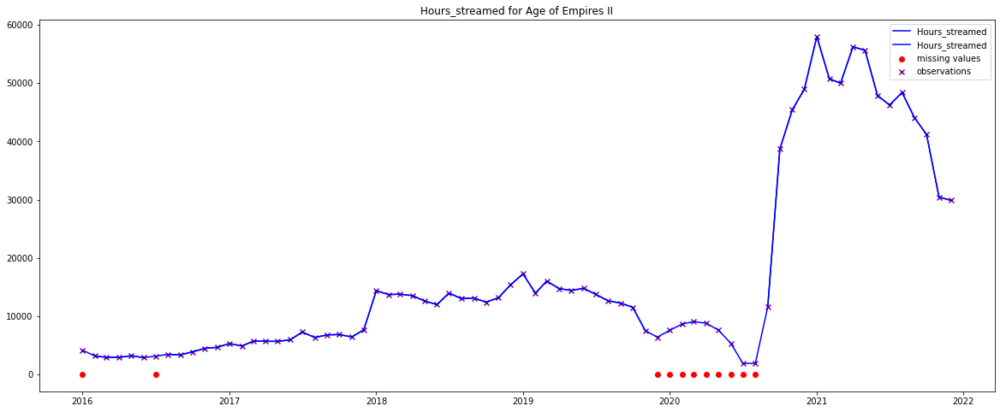

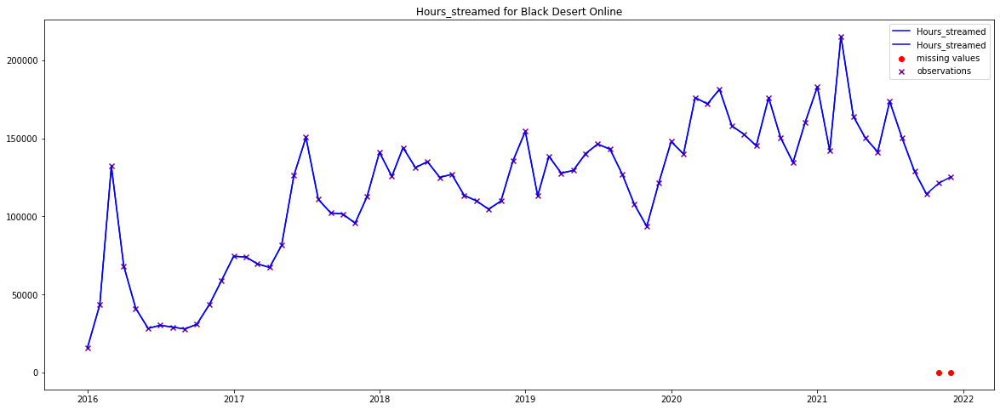

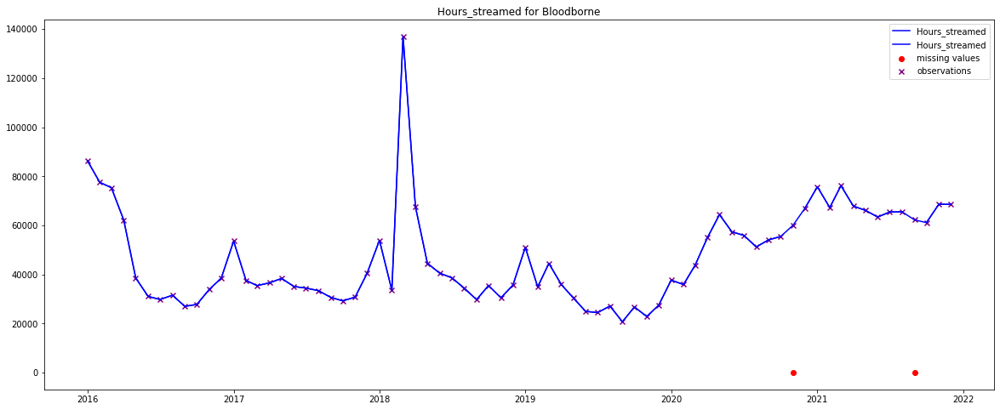

...

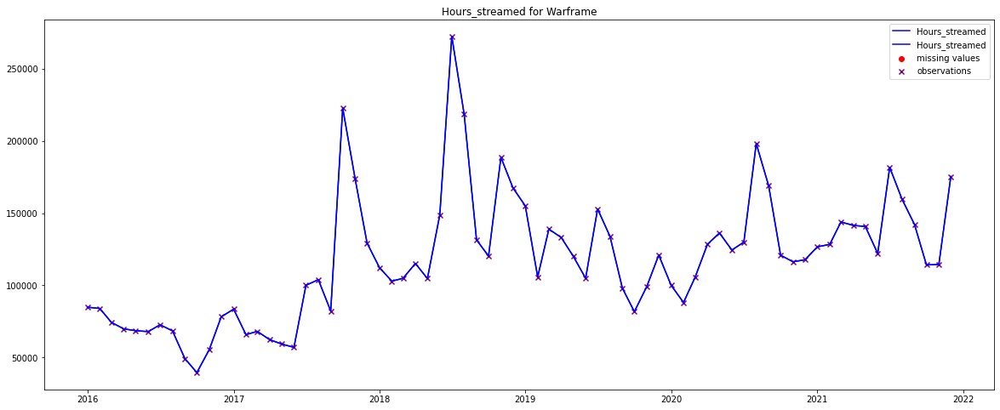

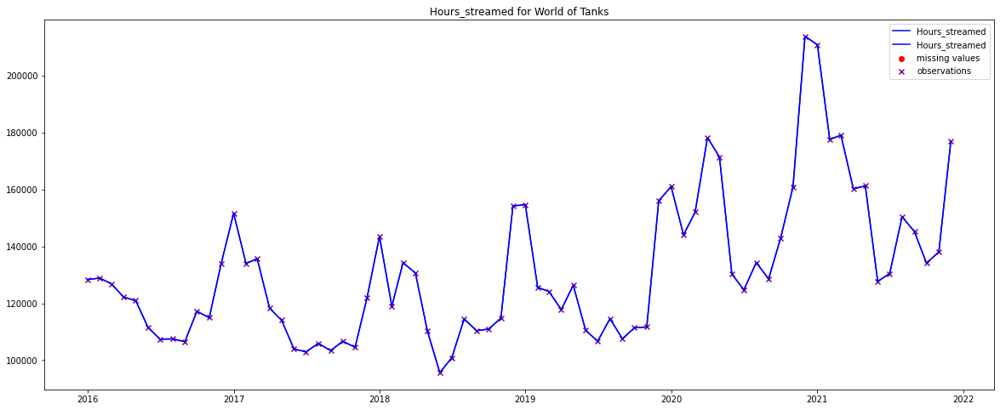

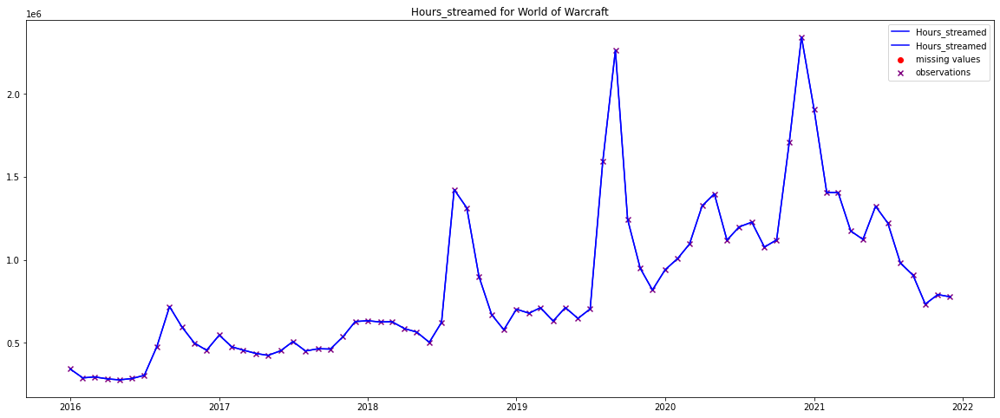

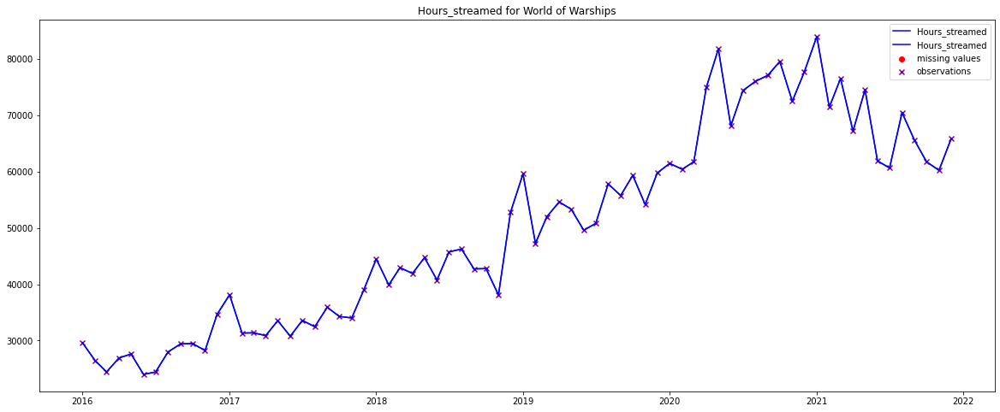

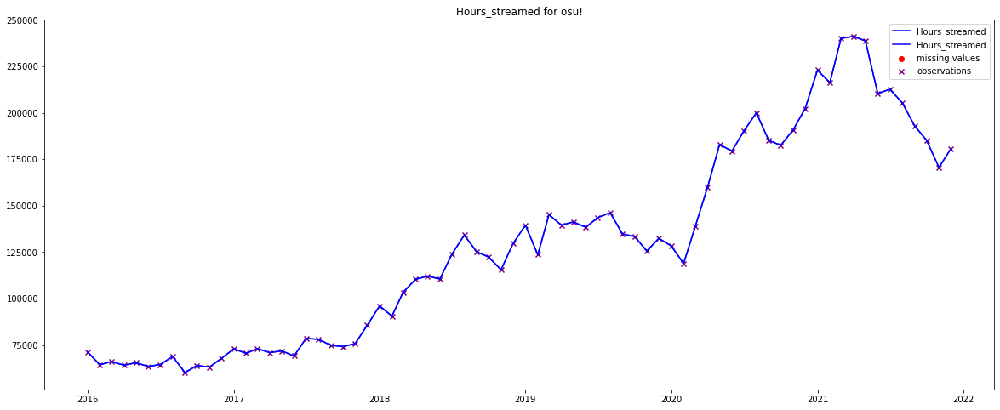

In [59]:
for game_name in df_train_filled['Game'].unique():
    tmp = df_train[df_train['Game'] == game_name]
    fig, ax = plot_series(df=tmp, feature_name="Hours_streamed", show_missing_range = True, plot_img=False)
    tmp = df_train_filled[df_train_filled['Game'] == game_name]
    plot_series(df=tmp, feature_name="Hours_streamed", ax=ax, show_sample_points=True, show_missing_range = True, plot_img=True);

C:\Users\Enri\AppData\Local\Temp/ipykernel_17396/3415311759.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


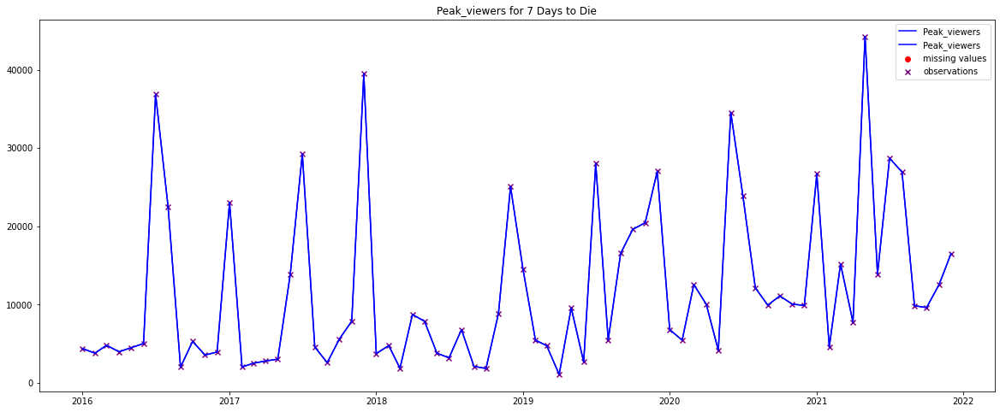

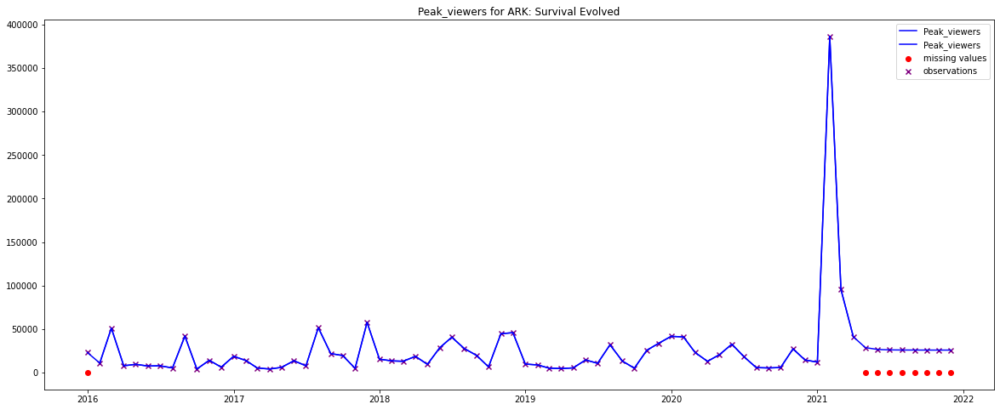

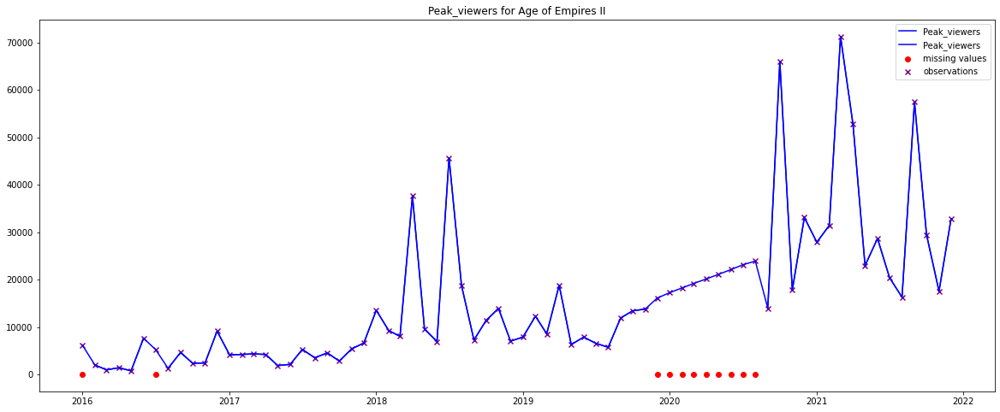

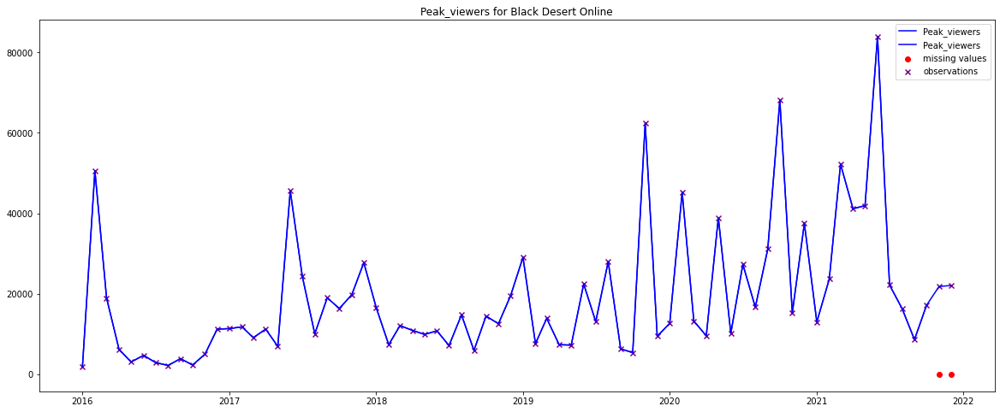

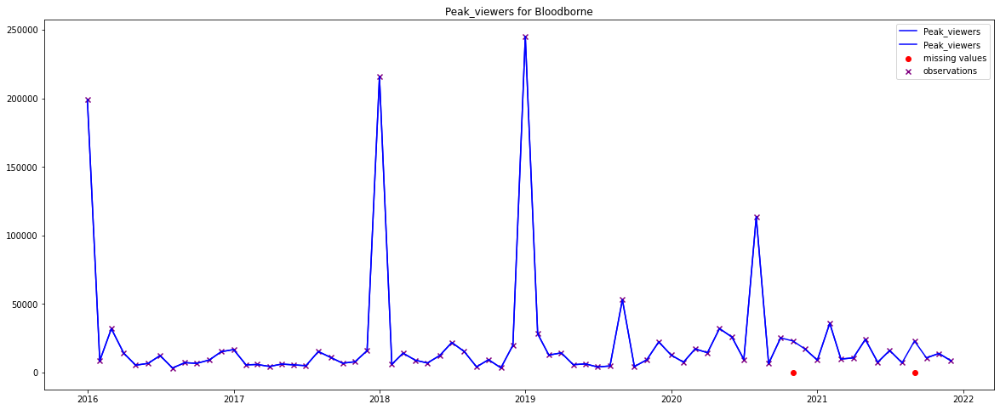

...

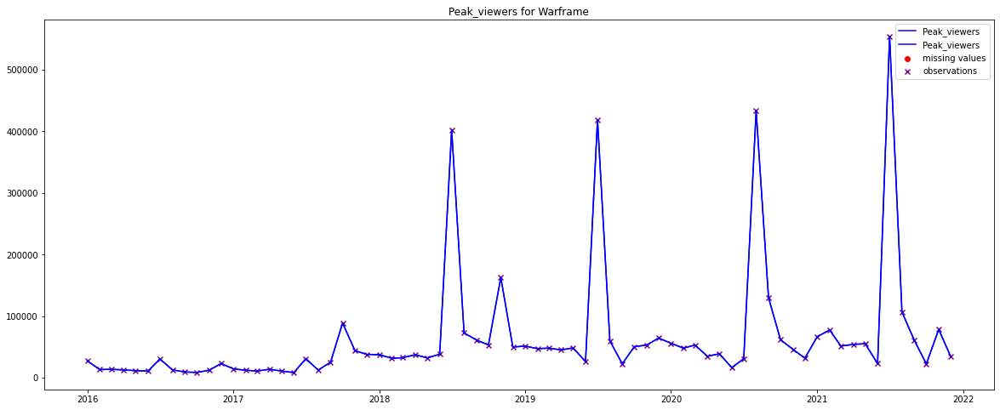

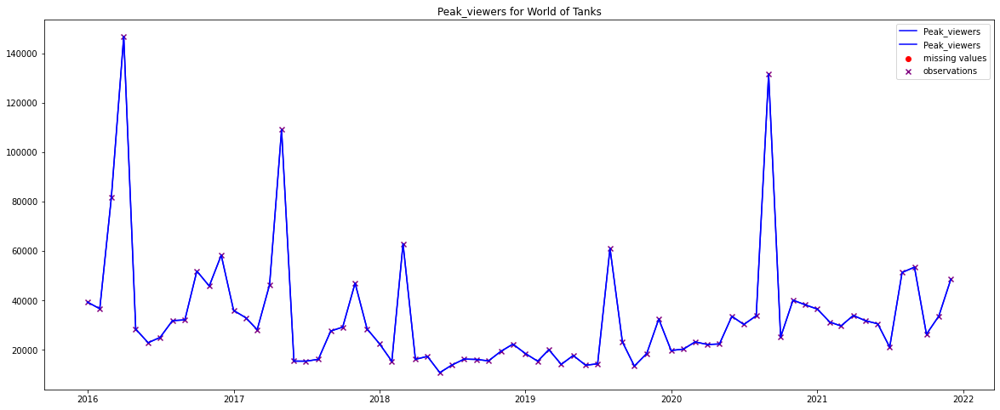

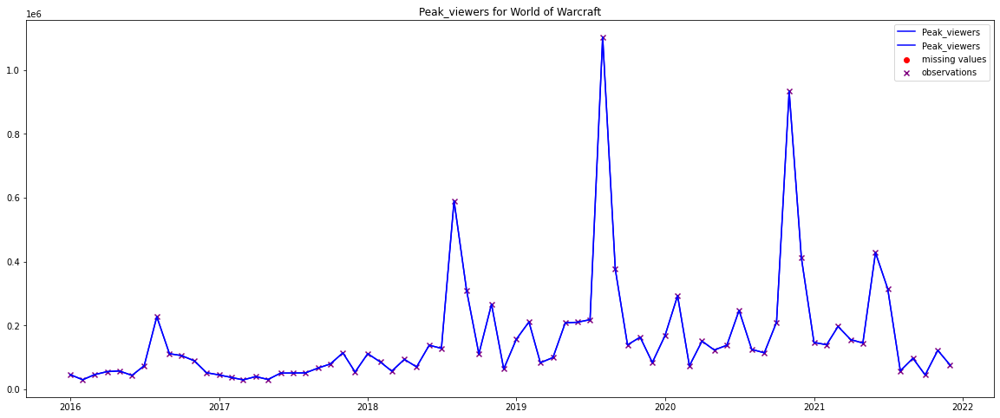

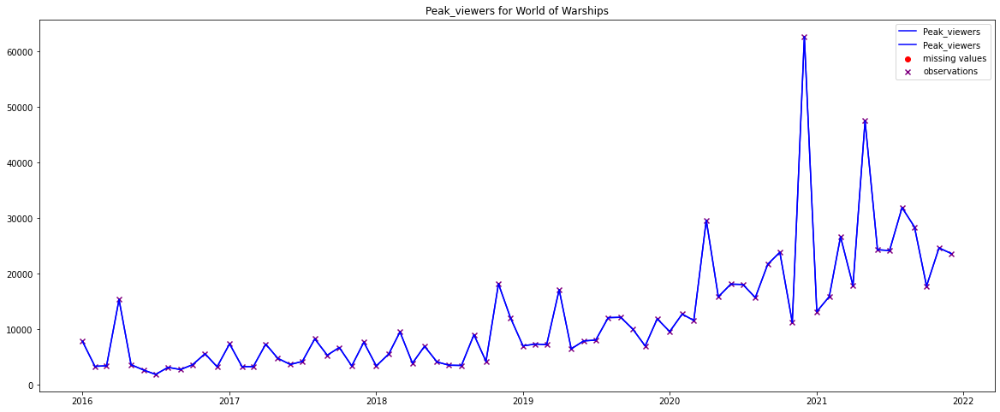

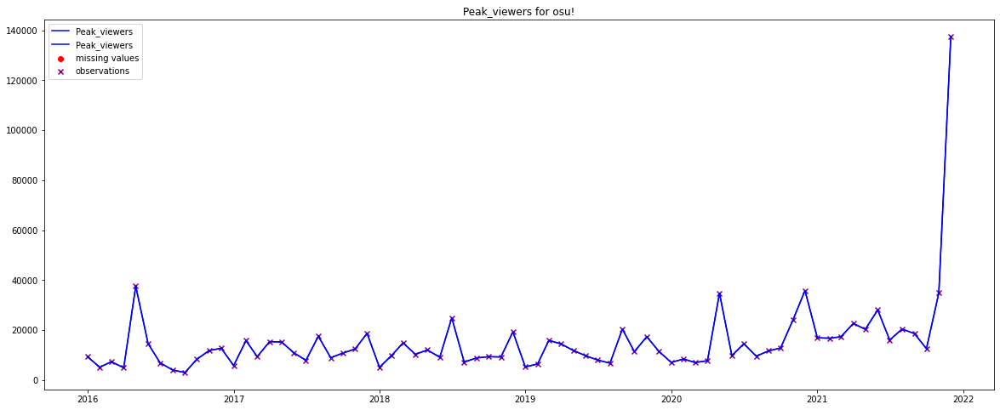

In [60]:
for game_name in df_train_filled['Game'].unique():
    tmp = df_train[df_train['Game'] == game_name]
    fig, ax = plot_series(df=tmp, feature_name="Peak_viewers", show_missing_range = True, plot_img=False)
    tmp = df_train_filled[df_train_filled['Game'] == game_name]
    plot_series(df=tmp, feature_name="Peak_viewers", ax=ax, show_sample_points=True, show_missing_range = True, plot_img=True);

## Forecasting

In [61]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

Try a very basic approach of next value prediction: from a single observation, predicts next month's

1. make dataset normalize/standardize?
2. make a simple nn
3. train on the training time_series
4. see results

We normalize because the data scale is very different
1. normalize between 0 and 1, with range 0~max in training set for each feature
2. maybe log scaling?

In [62]:
df_train_filled[df_train_filled['Hours_streamed'] <= 1]

,Game,Date,Hours_watched,Hours_streamed,Peak_viewers


In [63]:
df_train_norm = df_train_filled.copy()
df_val_norm = df_val.copy()
df_test_norm = df_test.copy()

## NORMALIZATION
#upper_bounds = df_train[features].max()
#upper_bounds.index = features
#df_train_norm[features] = df_train_norm[features] / upper_bounds

#df_test_norm[features] = df_test_norm[features] / upper_bounds

## LOG SCALING NORMALIZATION
df_train_norm[features] = np.log10(df_train_norm[features])
df_val_norm[features] = np.log10(df_val_norm[features])
df_test_norm[features] = np.log10(df_test_norm[features])

print(df_train_norm.describe())

       Hours_watched  Hours_streamed  Peak_viewers
count    4392.000000     4392.000000   4392.000000
mean        6.316676        4.872842      4.401247
std         0.634149        0.576660      0.569793
min         4.735993        3.276315      2.846955
25%         5.859760        4.490419      3.998270
50%         6.209141        4.820376      4.362558
75%         6.652522        5.168958      4.737336
max         8.403840        6.638928      6.488941


In [64]:
def predict_timesteps(model, x_in, timesteps=1):
    """x_in: input observation;
        timesteps: number of timesteps.
        
        Returns the concatenated outputs of the model by predicting on x_in and then on its predictions for timesteps times.
        Result = (batch_dim, timestep, features)"""

    batch_dim = x_in.shape[0]
    
    y = model.predict(x_in)

    result = np.ndarray((batch_dim, timesteps, y.shape[1]))

    result[:,0] = y

    #print(batch_dim, result.shape)
    
    for t in range(1,timesteps):
        y = model.predict(y)
        result[:,t] = y

    return result

In [65]:
def plot_rmse_stats(rmses: dict, features):
    df_rmses = pd.DataFrame(rmses).transpose()
    df_rmses.plot(y=features, kind="bar",figsize=figsize, title="log RMSE by game on the test set")
    plt.show()
    df_rmses.mean(axis=0).plot(y=features, kind="bar", title="log RMSE by feature on test set")
    plt.show()
    print("Stats:\n", df_rmses.describe().loc["mean"])

In [66]:
# model = util.build_nn_model(input_shape=3, output_shape=3, hidden=[1000, 1000])
# model.summary()

In [67]:
months_to_test = len(df_val['Date'].unique())
months_to_test

13

In [132]:
start_date = df_train_norm['Date'].min()
end_date = df_train_norm['Date'].max()

y = df_train_norm[df_train_norm['Date'] != start_date].reset_index(drop = True)
x = df_train_norm[df_train_norm['Date'] != end_date].reset_index(drop = True)

start_date_val = df_val_norm['Date'].min()
end_date_val = df_val_norm['Date'].max()

y_val = df_val_norm[df_val_norm['Date'] != start_date_val].reset_index(drop = True)
x_val = df_val_norm[df_val_norm['Date'] != end_date_val].reset_index(drop = True)

# train_7 = pd.DataFrame(x)
# train_7 = train_7.merge(y)
# which games are to be evaluated
is_input_to_baseline = (df_train_norm['Date'] == end_date) & (df_train_norm['Game'].isin(games_val))

Test with a single feature using a stupid 2-layer model

In [69]:
model_baseline_1f = {feature: None for feature in features}

In [70]:
for feature in features:
    inp = layers.Input((1,))
    l = layers.Dense(100, activation="relu")(inp)
    l = layers.Dropout(0.1)(l)
    l = layers.Dense(100, activation="relu")(l)
    l = layers.Dense(1)(l)

    model_baseline_1f[feature] = keras.Model(inp, l, name=f"model_1f_{feature}")
    model_baseline_1f[feature].summary()

    opt = keras.optimizers.Adam(learning_rate = 1e-3)
    model_baseline_1f[feature].compile(optimizer=opt, loss='mse')

Model: "model_1f_Hours_watched"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1)]               0         
                                                                 
 dense (Dense)               (None, 100)               200       
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense_1 (Dense)             (None, 100)               10100     
                                                                 
 dense_2 (Dense)             (None, 1)                 101       
                                                                 
Total params: 10,401
Trainable params: 10,401
Non-trainable params: 0
_________________________________________________________________
Model: "model_1f_Hours_streamed"
_______

Training model on single feature: Hours_watched
Epoch 1/100
136/136 [==============================] - 1s 2ms/step - loss: 1.2211 - val_loss: 0.0511 - lr: 0.0010
Epoch 2/100
136/136 [==============================] - 0s 919us/step - loss: 0.1193 - val_loss: 0.0890 - lr: 0.0010
Epoch 3/100
136/136 [==============================] - 0s 802us/step - loss: 0.1014 - val_loss: 0.1164 - lr: 0.0010
Epoch 4/100
136/136 [==============================] - 0s 770us/step - loss: 0.0853 - val_loss: 0.2156 - lr: 0.0010
Epoch 5/100
136/136 [==============================] - 0s 812us/step - loss: 0.0766 - val_loss: 0.1754 - lr: 0.0010
Epoch 6/100
136/136 [==============================] - 0s 841us/step - loss: 0.0708 - val_loss: 0.2505 - lr: 0.0010
Epoch 7/100
136/136 [==============================] - 0s 796us/step - loss: 0.0674 - val_loss: 0.3781 - lr: 0.0010
Epoch 8/100
136/136 [==============================] - 0s 790us/step - loss: 0.0620 - val_loss: 0.4279 - lr: 0.0010
Epoch 9/100
136/136 [=====

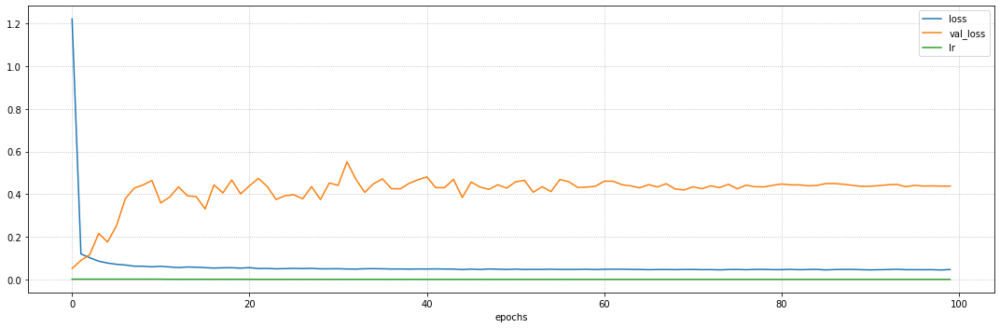

Final loss: 0.0463 (training), 0.4371 (validation)
Training model on single feature: Hours_streamed
Epoch 1/100
136/136 [==============================] - 0s 1ms/step - loss: 1.5976 - val_loss: 0.0108 - lr: 0.0010
Epoch 2/100
136/136 [==============================] - 0s 738us/step - loss: 0.0877 - val_loss: 0.0084 - lr: 0.0010
Epoch 3/100
136/136 [==============================] - 0s 743us/step - loss: 0.0701 - val_loss: 0.0151 - lr: 0.0010
Epoch 4/100
136/136 [==============================] - 0s 756us/step - loss: 0.0579 - val_loss: 0.0212 - lr: 0.0010
Epoch 5/100
136/136 [==============================] - 0s 743us/step - loss: 0.0537 - val_loss: 0.0157 - lr: 0.0010
Epoch 6/100
136/136 [==============================] - 0s 758us/step - loss: 0.0458 - val_loss: 0.0512 - lr: 0.0010
Epoch 7/100
136/136 [==============================] - 0s 737us/step - loss: 0.0424 - val_loss: 0.0443 - lr: 0.0010
Epoch 8/100
136/136 [==============================] - 0s 730us/step - loss: 0.0404 - val_

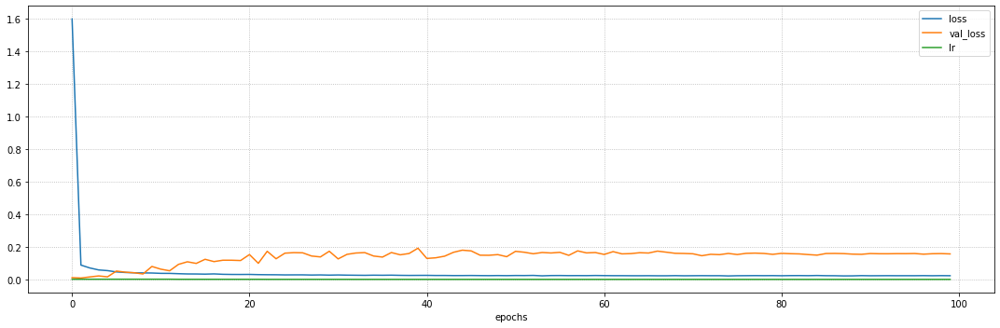

Final loss: 0.0226 (training), 0.1563 (validation)
Training model on single feature: Peak_viewers
Epoch 1/100
136/136 [==============================] - 0s 1ms/step - loss: 1.9109 - val_loss: 0.1132 - lr: 0.0010
Epoch 2/100
136/136 [==============================] - 0s 748us/step - loss: 0.1909 - val_loss: 0.1151 - lr: 0.0010
Epoch 3/100
136/136 [==============================] - 0s 758us/step - loss: 0.1802 - val_loss: 0.1233 - lr: 0.0010
Epoch 4/100
136/136 [==============================] - 0s 750us/step - loss: 0.1666 - val_loss: 0.1522 - lr: 0.0010
Epoch 5/100
136/136 [==============================] - 0s 737us/step - loss: 0.1644 - val_loss: 0.1184 - lr: 0.0010
Epoch 6/100
136/136 [==============================] - 0s 762us/step - loss: 0.1551 - val_loss: 0.1091 - lr: 0.0010
Epoch 7/100
136/136 [==============================] - 0s 751us/step - loss: 0.1603 - val_loss: 0.1109 - lr: 0.0010
Epoch 8/100
136/136 [==============================] - 0s 741us/step - loss: 0.1515 - val_lo

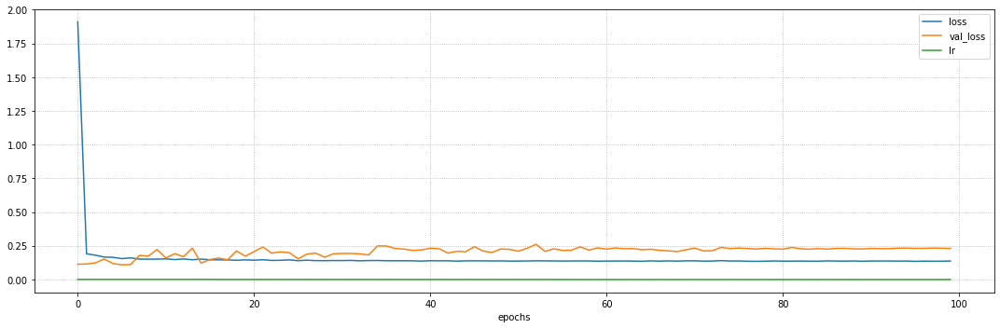

Final loss: 0.1373 (training), 0.2306 (validation)


In [71]:
# train the models
for feature in features:
    print(f"Training model on single feature: {feature}")
    reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                              patience=10, min_lr=1e-10)
    history = model_baseline_1f[feature].fit(x[feature], y[feature], validation_data=(x_val[feature], y_val[feature]), epochs=100, batch_size=32, callbacks=[reduce_lr])
    util.plot_training_history(history, figsize=figsize)

In [72]:
# evaluation
rmses_baseline_1f = {game_name: {} for game_name in df_val['Game'].unique()}
# predictions on test set for one feature at a time
val_predictions_1f = {feature: None for feature in features}

for feature_idx, feature in enumerate(features):
    val_predictions_1f[feature] = predict_timesteps(model_baseline_1f[feature], x_in=df_train_norm[is_input_to_baseline][feature], timesteps=months_to_test)
    # compute rmse on each game
    for pred_idx, t in enumerate(range(0, len(df_val), months_to_test)):
        preds = val_predictions_1f[feature][pred_idx]
        target = df_val_norm[feature][t:t+months_to_test]
        game = df_val["Game"].iloc[t]
        rmse = mean_squared_error(y_true=target, y_pred=preds)
        rmses_baseline_1f[game][feature] = rmse
        #util.plot_rul(preds, target, figsize=figsize)
        #plt.title(f"Predictions vs target for {feature}, {game}")

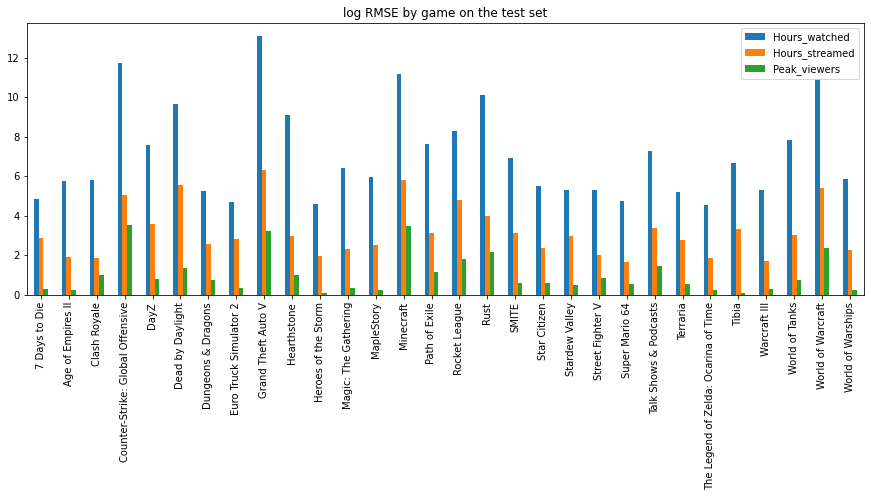

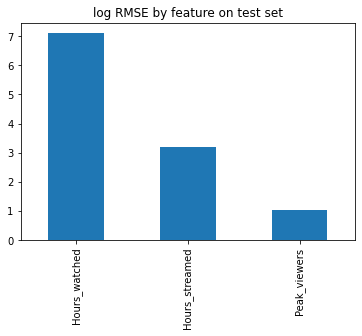

Stats:
 Hours_watched     7.103084
Hours_streamed    3.192638
Peak_viewers      1.028852
Name: mean, dtype: float64


In [73]:
plot_rmse_stats(rmses_baseline_1f, features=features)

Multiple inputs and multivariate predictions

In [74]:
inp = layers.Input((3,))
l = layers.Dense(100, activation="relu")(inp)
l = layers.Dense(100, activation="relu")(l)
l = layers.Dense(3)(l)

model_baseline = keras.Model(inp, l)
model_baseline.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 3)]               0         
                                                                 
 dense_9 (Dense)             (None, 100)               400       
                                                                 
 dense_10 (Dense)            (None, 100)               10100     
                                                                 
 dense_11 (Dense)            (None, 3)                 303       
                                                                 
Total params: 10,803
Trainable params: 10,803
Non-trainable params: 0
_________________________________________________________________


In [75]:
opt = keras.optimizers.Adam(learning_rate = 1e-3)
model_baseline.compile(optimizer=opt, loss='mse')
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                              patience=10, min_lr=1e-10)
history = model_baseline.fit(x[features], y[features], epochs=100, validation_data=(x_val[features], y_val[features]), batch_size=32, callbacks=[reduce_lr])

Epoch 1/100
136/136 [==============================] - 0s 1ms/step - loss: 2.0086 - val_loss: 0.0658 - lr: 0.0010
Epoch 2/100
136/136 [==============================] - 0s 721us/step - loss: 0.0714 - val_loss: 0.0544 - lr: 0.0010
Epoch 3/100
136/136 [==============================] - 0s 694us/step - loss: 0.0623 - val_loss: 0.0524 - lr: 0.0010
Epoch 4/100
136/136 [==============================] - 0s 697us/step - loss: 0.0605 - val_loss: 0.0523 - lr: 0.0010
Epoch 5/100
136/136 [==============================] - 0s 694us/step - loss: 0.0596 - val_loss: 0.0536 - lr: 0.0010
Epoch 6/100
136/136 [==============================] - 0s 724us/step - loss: 0.0587 - val_loss: 0.0502 - lr: 0.0010
Epoch 7/100
136/136 [==============================] - 0s 705us/step - loss: 0.0582 - val_loss: 0.0499 - lr: 0.0010
Epoch 8/100
136/136 [==============================] - 0s 680us/step - loss: 0.0571 - val_loss: 0.0484 - lr: 0.0010
Epoch 9/100
136/136 [==============================] - 0s 681us/step - los

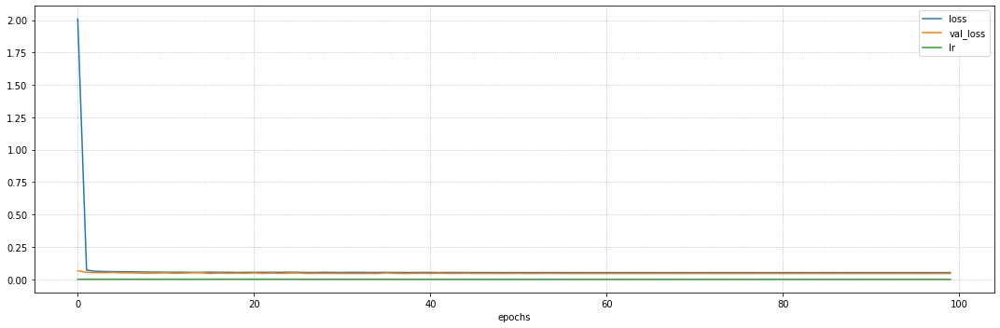

Final loss: 0.0518 (training), 0.0449 (validation)


In [76]:
# history = util.train_nn_model(model, df_train_norm[features].values, df_train_norm[features].values, loss='mse', epochs=30, validation_split=0.2, batch_size=32)
util.plot_training_history(history, figsize=figsize)

Side by side comparison of predicting on predictions vs predicting only the next step from a known value

In [77]:
# def predict_timesteps(model, x_in, timesteps=1):
# """x_in: input observation;
#     timesteps: number of timesteps.
    
#     Returns the concatenated outputs of the model by predicting on x_in and then on its predictions for timesteps times."""

# y = model.predict(x_in)
# result = y.copy()

# if timesteps==1:
#     return result
# else: return np.concatenate([result, predict_timesteps(model, y, timesteps=timesteps-1)])

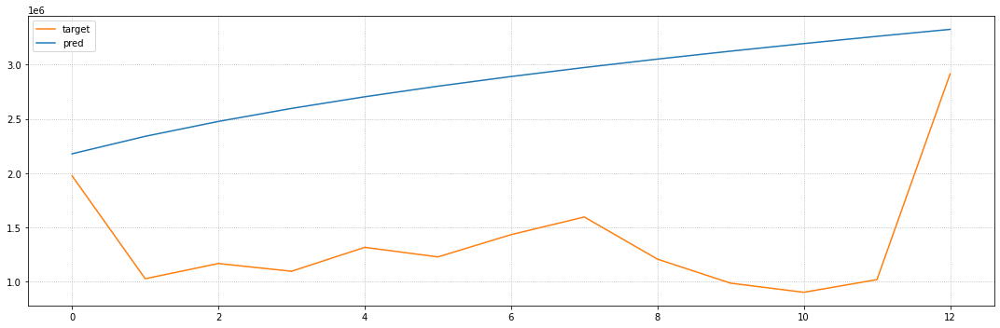

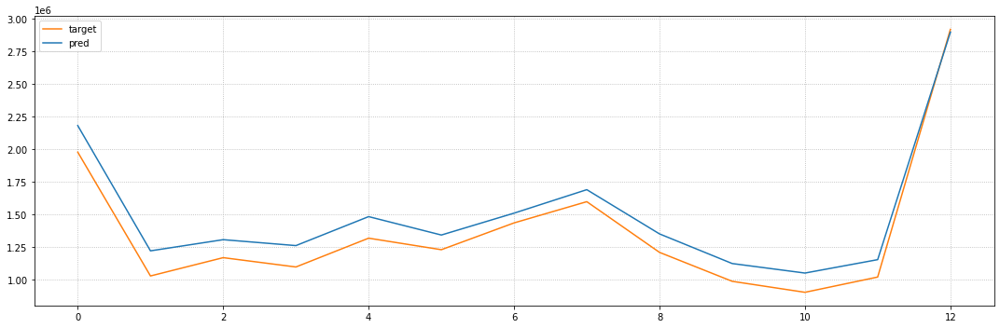

In [78]:
val_preds = predict_timesteps(model_baseline, x_in=df_val_norm[features][:1], timesteps=months_to_test)[0]
util.plot_rul(10**val_preds[:,0], df_val["Hours_watched"][:months_to_test], figsize=figsize)
tr_pred = model_baseline.predict(df_val_norm[features][:months_to_test])
util.plot_rul(10**tr_pred[:months_to_test][:,0], df_val["Hours_watched"][:months_to_test], figsize=figsize)

In [79]:
np.sqrt(mean_squared_error(10**val_preds[:,0], df_val["Hours_watched"][:months_to_test]))

1584911.952245254

In [80]:
# normalized for now
val_predictions = predict_timesteps(model_baseline, x_in=df_train_norm[is_input_to_baseline][features], timesteps=months_to_test)

rmse_baseline = np.sqrt(mean_squared_error(val_predictions.reshape((df_val[features].shape)), df_val[features], multioutput='raw_values'))

In [81]:
rmses_baseline = {game_name: {} for game_name in df_val['Game'].unique()}

for feature_idx, feature in enumerate(features):
    for t in range(0, len(df_val), months_to_test):
        preds = val_predictions.reshape(df_val_norm[features].shape)[t:t+months_to_test, feature_idx]
        target = df_val_norm[feature][t:t+months_to_test]
        game = df_val["Game"].iloc[t]
        rmse = mean_squared_error(y_true=target, y_pred=preds)
        rmses_baseline[game][feature] = rmse
        #util.plot_rul(preds, target, figsize=figsize)
        #plt.title(f"Predictions vs target for {feature}, {game}")

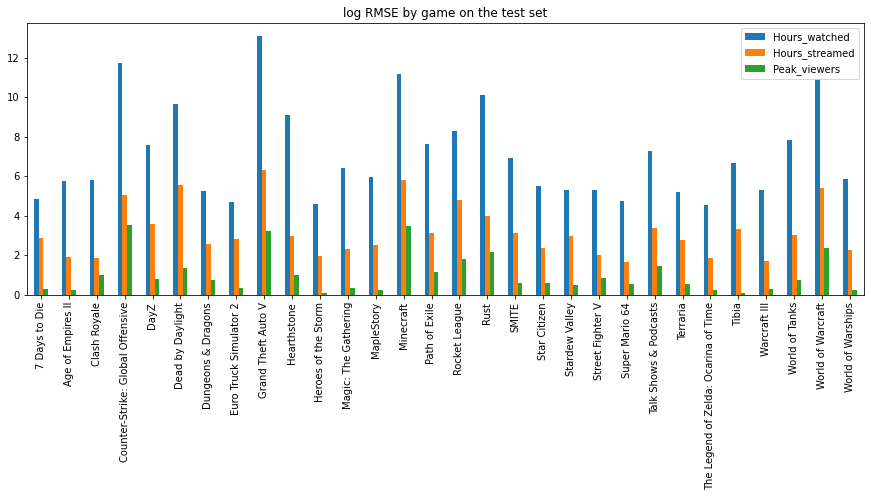

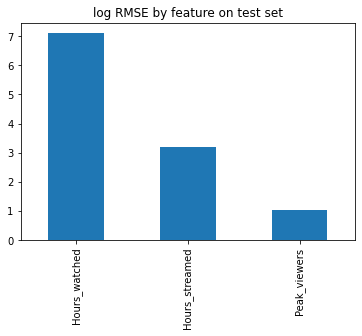

Stats:
 Hours_watched     7.103084
Hours_streamed    3.192638
Peak_viewers      1.028852
Name: mean, dtype: float64


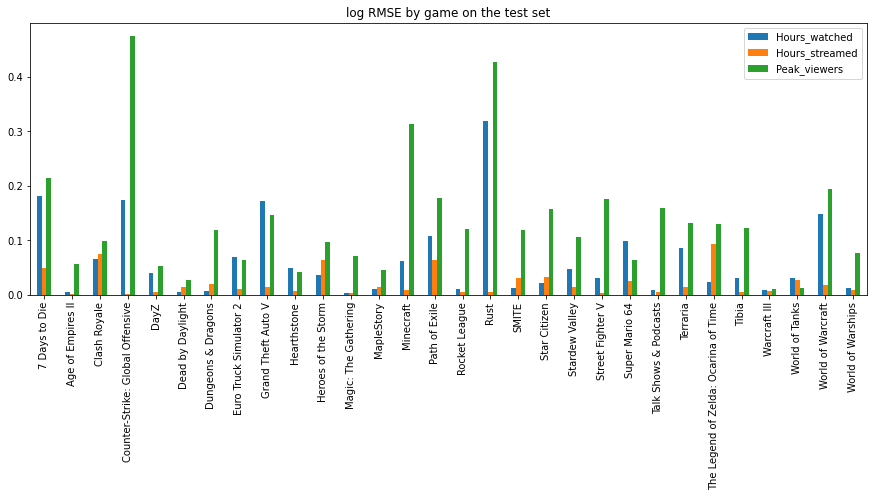

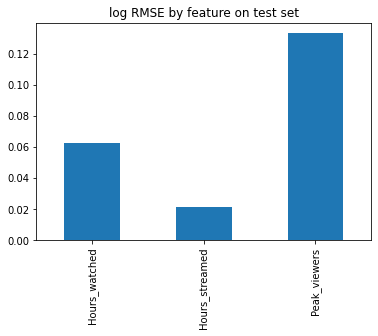

Stats:
 Hours_watched     0.062501
Hours_streamed    0.021284
Peak_viewers      0.133294
Name: mean, dtype: float64


In [82]:
plot_rmse_stats(rmses_baseline_1f, features=features) # set title manually
plot_rmse_stats(rmses_baseline, features=features)

In [83]:
val_predictions.shape

(30, 13, 3)

c:\Users\Enri\Desktop\AIMaster\AIINDUSTRY\A3I_project/04-rul\notebooks\util\util.py:227: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=figsize)


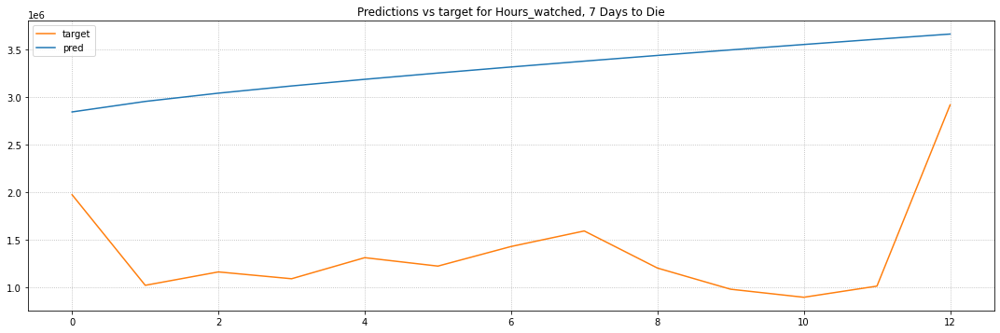

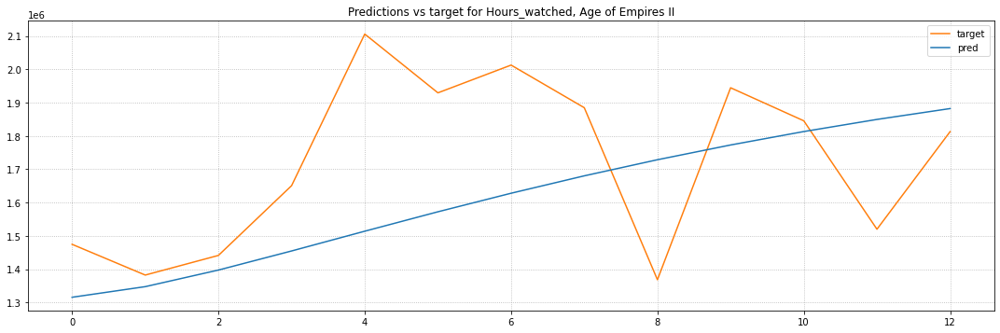

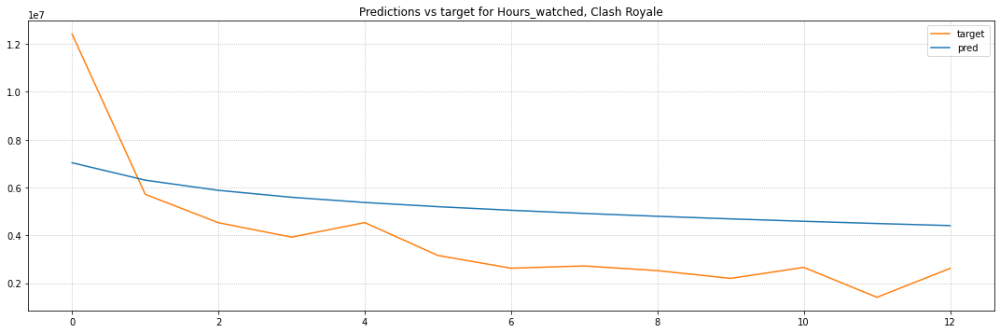

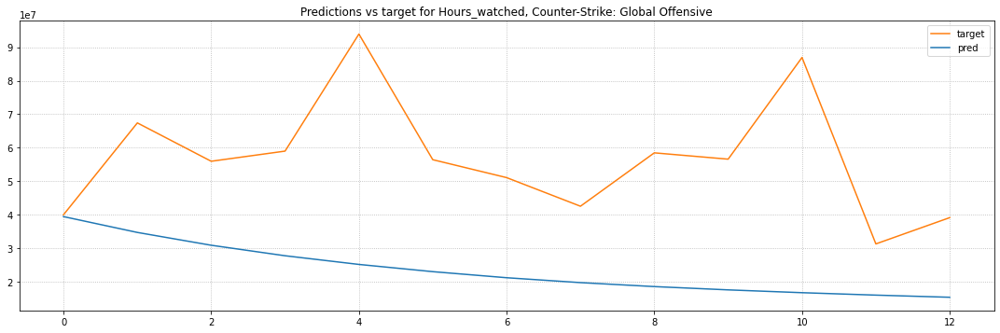

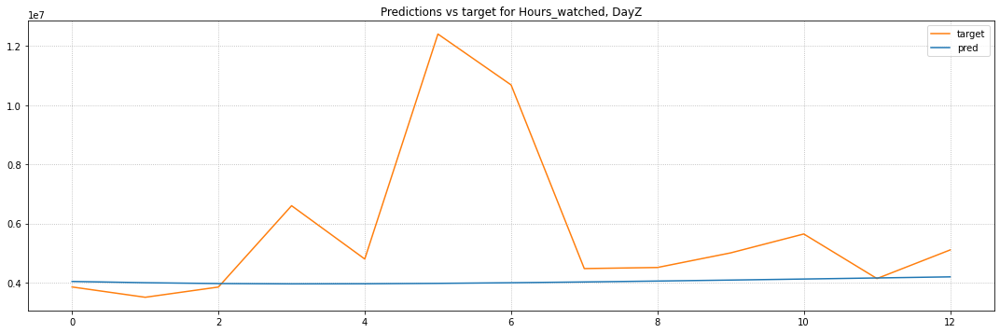

...

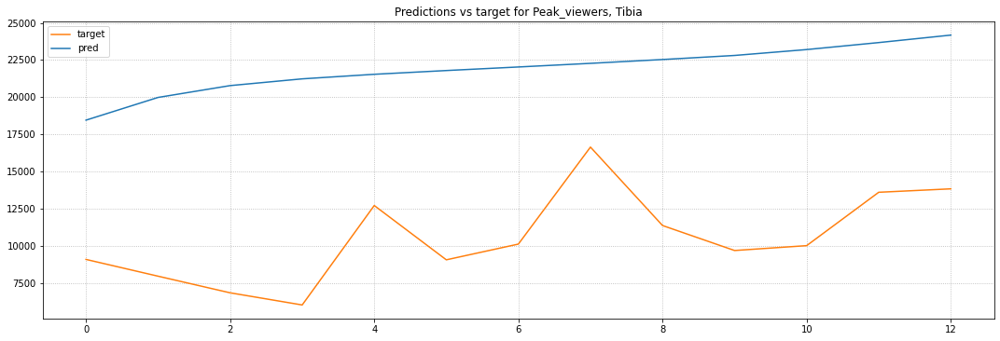

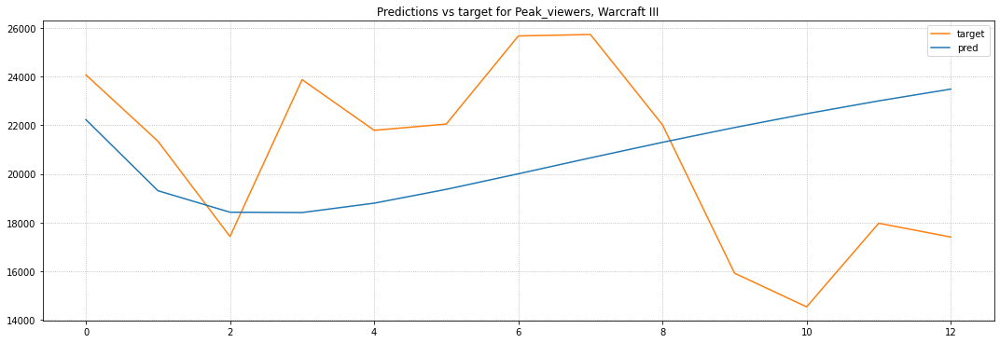

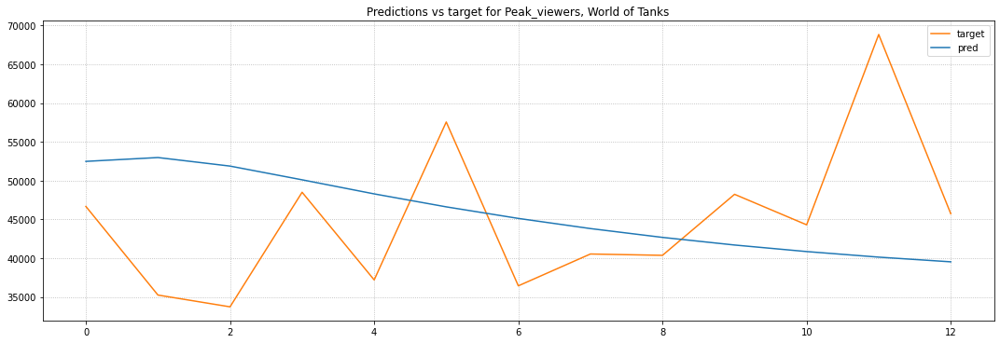

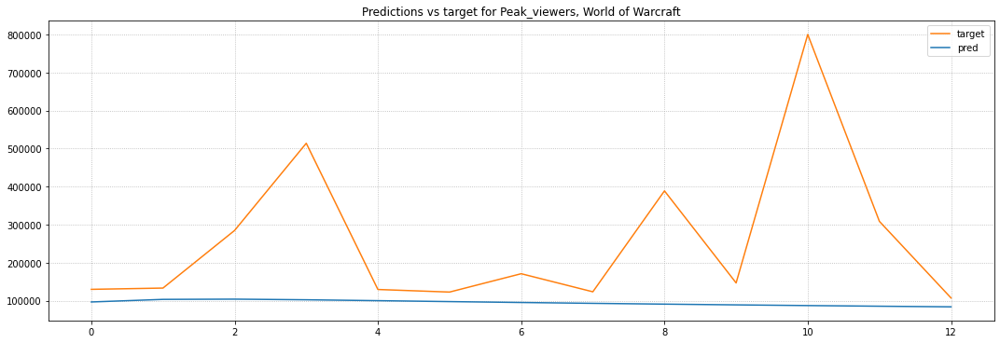

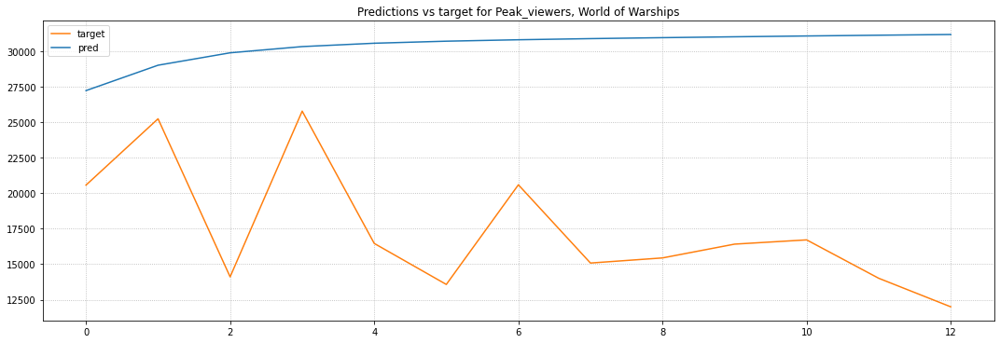

In [84]:
for feature_idx, feature in enumerate(features):
    for t in range(0, len(df_val),months_to_test):
        preds = 10**val_predictions.reshape(df_val[features].shape)[t:t+months_to_test, feature_idx]
        target = df_val[feature][t:t+months_to_test]
        game = df_val["Game"].iloc[t]
        util.plot_rul(preds, target, figsize=figsize)
        plt.title(f"Predictions vs target for {feature}, {game}")

In [85]:
# create fun for compute test error
# understand why it works so well
# try model that takes more than one value
# try other models and methods

## Model that uses more data points / window

In [86]:
from darts import TimeSeries, timeseries

In [87]:
series_dict_train = {}

for game_name in df_train_filled['Game'].unique():
    series = df_train_norm[df_train_norm['Game'] == game_name].reset_index(drop=True)
    series = TimeSeries.from_dataframe(series, time_col="Date", value_cols=features)
    #series.plot(new_plot=True)
    series_dict_train[game_name] = series

series_dict_val = {}
for game_name in df_val_norm['Game'].unique():
    series = df_val_norm[df_val_norm['Game'] == game_name].reset_index(drop=True)
    series = TimeSeries.from_dataframe(series, time_col="Date", value_cols=features)
    #series.plot(new_plot=True)
    series_dict_val[game_name] = series

series_dict_test = {}
for game_name in df_test_norm['Game'].unique():
    series = df_test_norm[df_test_norm['Game'] == game_name].reset_index(drop=True)
    series = TimeSeries.from_dataframe(series, time_col="Date", value_cols=features)
    #series.plot(new_plot=True)
    series_dict_test[game_name] = series

In [88]:
from darts.models import NBEATSModel, RandomForest, RNNModel, CatBoostModel

model = NBEATSModel(input_chunk_length=dates_count//2, output_chunk_length=months_to_test, random_state=42)

model.fit(list(series_dict_train.values()), epochs=10, verbose=True);

<frozen importlib._bootstrap>:228: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216 from C header, got 232 from PyObject
d:\Anaconda\lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: [WinError 127] The specified procedure could not be found
  warn(f"Failed to load image Python extension: {e}")
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 6.9 M 
---------------------------------------------------
6.9 M     Trainable params
1.9 K     Non-trainable params
6.9 M     Total params
54.896    Total estimated model params size (MB)


Epoch 9: 100%|██████████| 46/46 [00:05<00:00,  8.32it/s, loss=0.0847, train_loss=0.0896]


In [89]:
#model = RandomForest(lags = dates_count//2, output_chunk_length=months_to_test, random_state=42)
#model.fit(list(series_dict_train.values()));

In [90]:
#model = RNNModel(input_chunk_length=dates_count//2, output_chunk_length=months_to_test, random_state=42)
#model.fit(list(series_dict_train.values()), epochs=10, verbose=True);

In [91]:
#model = CatBoostModel(lags = dates_count//2, output_chunk_length=months_to_test, random_state=42)
#model.fit(list(series_dict_train.values()), verbose=True);

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU ava

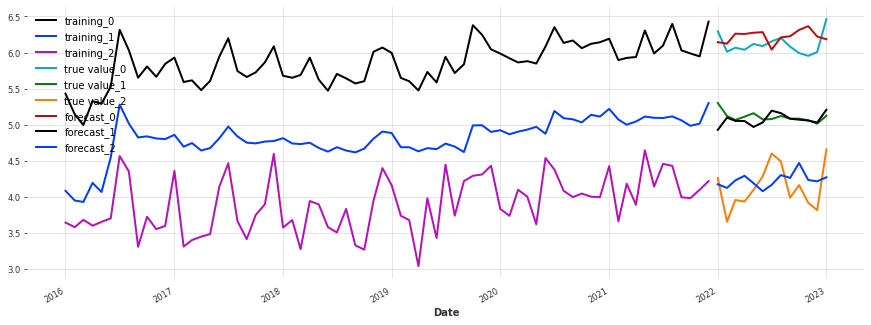

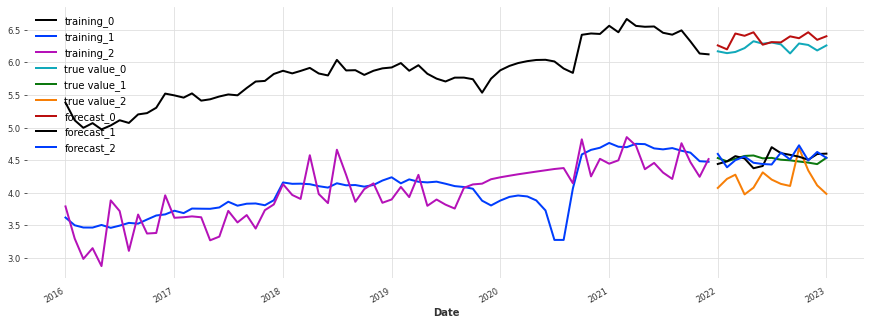

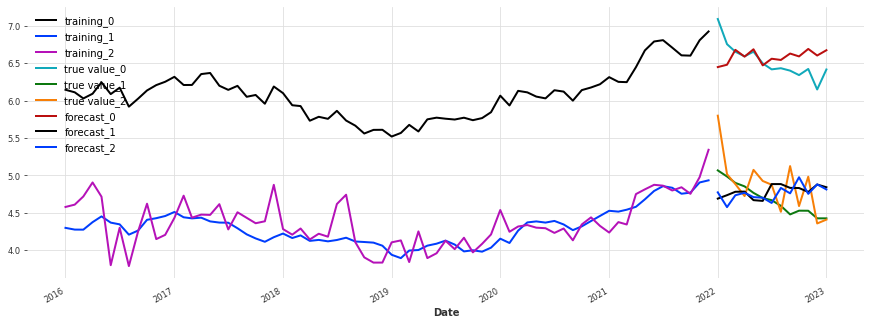

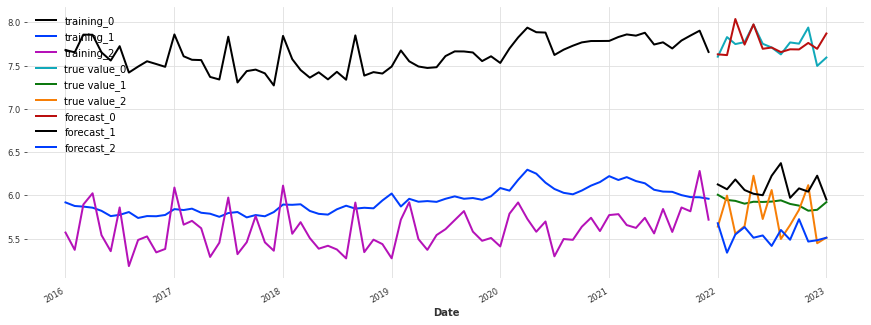

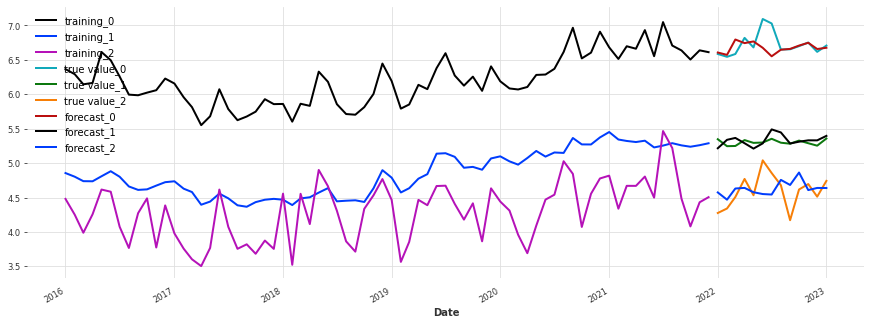

...

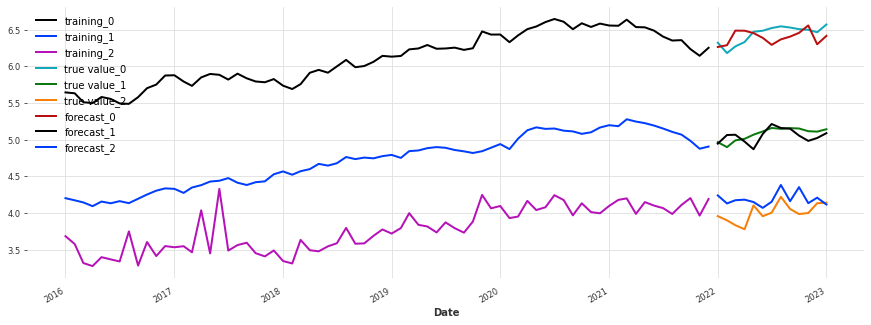

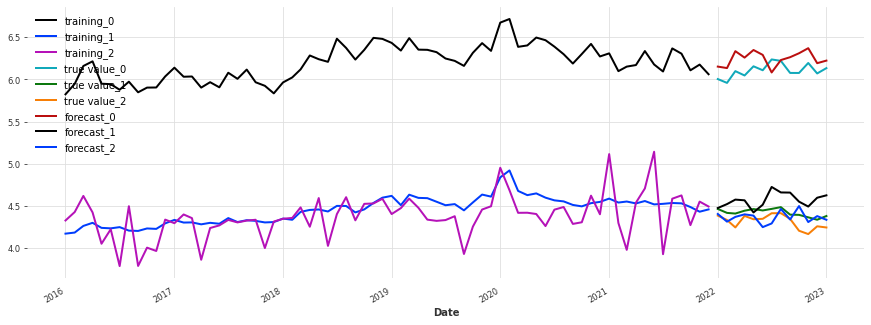

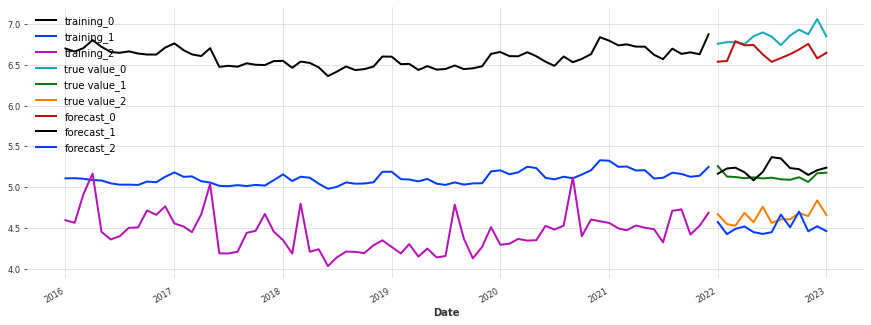

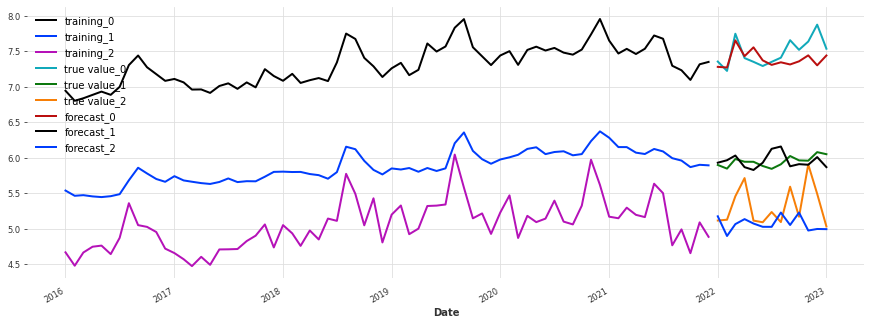

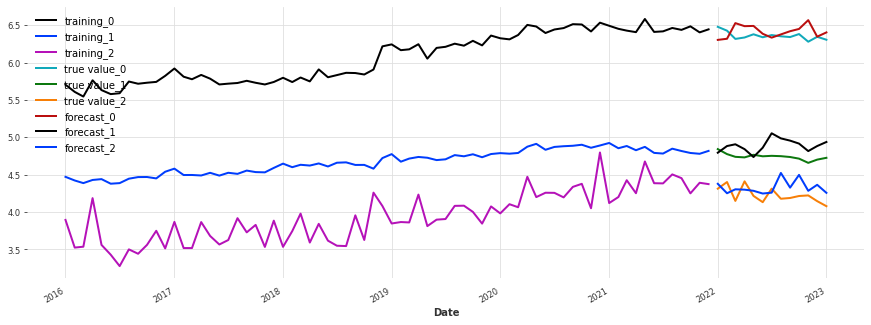

In [92]:
for game_name in series_dict_val.keys():

    preds = model.predict(series=series_dict_train[game_name], n=months_to_test, verbose=False)
    #preds = np.power(10,preds)
    #preds = preds.map(lambda x: 10 ** x)
    plt.figure(figsize=figsize)
    #series_dict_train[game_name].map(lambda x: 10 ** x).plot(label="training")
    #series_dict_test[game_name].map(lambda x: 10 ** x).plot(label="true value")
    series_dict_train[game_name].plot(label="training")
    series_dict_val[game_name].plot(label="true value")
    preds.plot(label="forecast")

In [93]:
rmses = {}
for game_name in series_dict_val.keys():
    preds = model.predict(series=series_dict_train[game_name], n=months_to_test, verbose=False)
    
    rmse = mean_squared_error(y_true=series_dict_val[game_name].values(), y_pred=preds.values(), multioutput='raw_values')
    rmses[game_name] = {feature: rmse[i] for i, feature in enumerate(features)}

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU ava

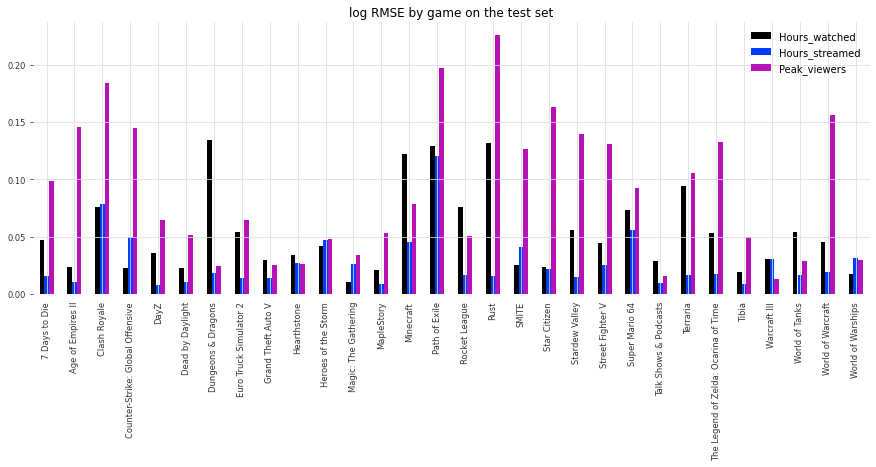

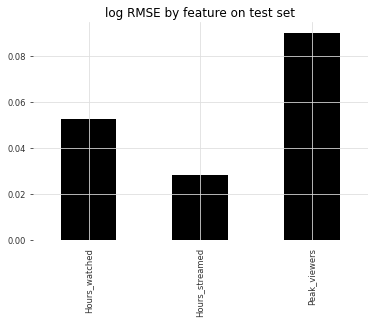

Stats:
 Hours_watched     0.052667
Hours_streamed    0.027978
Peak_viewers      0.090036
Name: mean, dtype: float64


In [94]:
plot_rmse_stats(rmses, features)

TODO
1. Try a univariate model for each feature and compare the RMSE to see if using multiple features at train time is better than using one model for each feature. (ok multiple features seems better)

2. manually make a model that is trained on a window of inputs and predicts the next value(S?). (maybe also predicts multiple values?)- -- we have to prepare the inputs/outputs basically 

Input: a batch of N=12 observations (3 features each) 
in -> (batch_size, window_size, features). 
in the middle, bi? lstm/rnn? and dense layers.
output -> (???) if timedistributed then output shape is going to be the same of the input shape, features

the important part is to decide the learning target

3. clean code
4. try another model (e.g. xgboost, rnn)

In [131]:
# model with window
window_in_size = 24 #nbeats windows for comparison
hidden_size = 128
window_out_size = months_to_test
x_in = keras.layers.Input((window_in_size, len(features)))

# lstm over the sequence
x_layer = keras.layers.LSTM(units = hidden_size, return_sequences=True)(x_in)

# timedistributed
dense = keras.layers.Dense(hidden_size)
x_layer = keras.layers.TimeDistributed(dense)(x_layer)
x_layer = keras.layers.Flatten()(x_layer)

# (batchsize, window_in, hidden)
# custom output window
#flatten? 
#out = []
#for i in range(len(features)):
#    out.append(keras.layers.Dense(window_out_size*len(features))(x))

x_layer = keras.layers.Dense(window_out_size*len(features))(x_layer)
out = keras.layers.Reshape((13,3))(x_layer)

model_window = keras.Model(x_in, out)

model_window.summary()

Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(None, 24, 3)]           0         
                                                                 
 lstm_14 (LSTM)              (None, 24, 128)           67584     
                                                                 
 time_distributed_13 (TimeDi  (None, 24, 128)          16512     
 stributed)                                                      
                                                                 
 flatten_7 (Flatten)         (None, 3072)              0         
                                                                 
 dense_43 (Dense)            (None, 39)                119847    
                                                                 
 reshape_5 (Reshape)         (None, 13, 3)             0         
                                                          

In [129]:
model_window.predict(np.ones((1, 24,3))).shape

(1, 13, 3)

In [136]:
x.loc[:23, features].shape

(24, 3)

train
x sample: 24 observations, y sample: 13 observations following the last from x

In [165]:
win_x = df_train_norm.copy()
win_y = df_train_norm.copy()

In [433]:
discard_date_window_x = df_train_norm['Date'].max() - pd.DateOffset(months=window_out_size)
print(discard_date_window_x)
#end_date = df_train_norm['Date'].max()
discard_date_window_y = df_train_norm['Date'].min() + pd.DateOffset(months=window_in_size)
print(discard_date_window_y)
#y = df_train_norm[df_train_norm['Date'] != start_date].reset_index(drop = True)
win_x_train = df_train_norm[df_train_norm['Date'] <= discard_date_window_x].reset_index(drop = True)
win_y_train = df_train_norm[df_train_norm['Date'] >= discard_date_window_y].reset_index(drop = True)

# problem with val
# discard_date_window_x = df_val_norm['Date'].max() - pd.DateOffset(months=window_out_size)
# print(discard_date_window_x)
# #end_date = df_train_norm['Date'].max()
# discard_date_window_y = df_val_norm['Date'].min() + pd.DateOffset(months=window_in_size)
# print(discard_date_window_y)
# win_x_val = df_val_norm[df_val_norm['Date'] <= discard_date_window_x].reset_index(drop = True)
# win_y_val = df_val_norm[df_val_norm['Date'] >= discard_date_window_y].reset_index(drop = True)

2020-11-01 00:00:00
2018-01-01 00:00:00


In [416]:
len(win_x)//61, len(win_y)//61

(59, 48)

In [417]:
win_x["Date"].unique()

array(['2016-01-01T00:00:00.000000000', '2016-02-01T00:00:00.000000000',
       '2016-03-01T00:00:00.000000000', '2016-04-01T00:00:00.000000000',
       '2016-05-01T00:00:00.000000000', '2016-06-01T00:00:00.000000000',
       '2016-07-01T00:00:00.000000000', '2016-08-01T00:00:00.000000000',
       '2016-09-01T00:00:00.000000000', '2016-10-01T00:00:00.000000000',
       '2016-11-01T00:00:00.000000000', '2016-12-01T00:00:00.000000000',
       '2017-01-01T00:00:00.000000000', '2017-02-01T00:00:00.000000000',
       '2017-03-01T00:00:00.000000000', '2017-04-01T00:00:00.000000000',
       '2017-05-01T00:00:00.000000000', '2017-06-01T00:00:00.000000000',
       '2017-07-01T00:00:00.000000000', '2017-08-01T00:00:00.000000000',
       '2017-09-01T00:00:00.000000000', '2017-10-01T00:00:00.000000000',
       '2017-11-01T00:00:00.000000000', '2017-12-01T00:00:00.000000000',
       '2018-01-01T00:00:00.000000000', '2018-02-01T00:00:00.000000000',
       '2018-03-01T00:00:00.000000000', '2018-04-01

In [418]:
win_y["Date"].unique()

array(['2018-01-01T00:00:00.000000000', '2018-02-01T00:00:00.000000000',
       '2018-03-01T00:00:00.000000000', '2018-04-01T00:00:00.000000000',
       '2018-05-01T00:00:00.000000000', '2018-06-01T00:00:00.000000000',
       '2018-07-01T00:00:00.000000000', '2018-08-01T00:00:00.000000000',
       '2018-09-01T00:00:00.000000000', '2018-10-01T00:00:00.000000000',
       '2018-11-01T00:00:00.000000000', '2018-12-01T00:00:00.000000000',
       '2019-01-01T00:00:00.000000000', '2019-02-01T00:00:00.000000000',
       '2019-03-01T00:00:00.000000000', '2019-04-01T00:00:00.000000000',
       '2019-05-01T00:00:00.000000000', '2019-06-01T00:00:00.000000000',
       '2019-07-01T00:00:00.000000000', '2019-08-01T00:00:00.000000000',
       '2019-09-01T00:00:00.000000000', '2019-10-01T00:00:00.000000000',
       '2019-11-01T00:00:00.000000000', '2019-12-01T00:00:00.000000000',
       '2020-01-01T00:00:00.000000000', '2020-02-01T00:00:00.000000000',
       '2020-03-01T00:00:00.000000000', '2020-04-01

In [419]:
def make_windows(win, window_size, features=features):
    win_list = win.groupby(by='Game')[features].agg(list).reset_index()
    win_list[features] = win_list[features].applymap(np.asarray)
    x = []
    
    for game_name in win_list["Game"].unique():
        for t in range(len(win_list.iloc[0,1]) - window_size):
            select_game = win_list["Game"] == game_name
            x_temp = []
            for feature in features:
                #print(win_list[select_game][feature][t:t+window_size])
                x_temp.append(win_list[select_game][feature].values[0][t:t+window_size])
            x.append(x_temp)
    return np.transpose(np.array(x), axes=(0, 2, 1))
    #return win_list

In [319]:
win_list.iloc[0,1:][0][0:24].shape

(24,)

In [434]:
x_window_train = make_windows(win_x_train, window_in_size)
y_window_train = make_windows(win_y_train, window_out_size)

#x_window_val = make_windows(win_x_val, window_in_size)
#y_window_val = make_windows(win_y_val, window_out_size)

In [423]:
y_window.shape, y_window.shape

((2135, 13, 3), (2135, 13, 3))

In [435]:
# train
opt = keras.optimizers.Adam(learning_rate = 1e-3)
model_window.compile(optimizer=opt, loss='mse')
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.5,
                              patience=10, min_lr=1e-10)
history = model_window.fit(x_window_train, y_window_train, epochs=100, batch_size=32, callbacks=[reduce_lr])

Epoch 1/100
67/67 [==============================] - 2s 10ms/step - loss: 1.6620 - lr: 0.0010
Epoch 2/100
67/67 [==============================] - 1s 9ms/step - loss: 0.1245 - lr: 0.0010
Epoch 3/100
67/67 [==============================] - 1s 9ms/step - loss: 0.1068 - lr: 0.0010
Epoch 4/100
67/67 [==============================] - 1s 9ms/step - loss: 0.0948 - lr: 0.0010
Epoch 5/100
67/67 [==============================] - 1s 9ms/step - loss: 0.0932 - lr: 0.0010
Epoch 6/100
67/67 [==============================] - 1s 9ms/step - loss: 0.0884 - lr: 0.0010
Epoch 7/100
67/67 [==============================] - 1s 9ms/step - loss: 0.0909 - lr: 0.0010
Epoch 8/100
67/67 [==============================] - 1s 9ms/step - loss: 0.0853 - lr: 0.0010
Epoch 9/100
67/67 [==============================] - 1s 9ms/step - loss: 0.0823 - lr: 0.0010
Epoch 10/100
67/67 [==============================] - 1s 9ms/step - loss: 0.0813 - lr: 0.0010
Epoch 11/100
67/67 [==============================] - 1s 9ms/step - 

In [481]:
input_test = df_train_norm[df_train_norm["Game"] == "7 Days to Die"][-24:][features].values
input_test.shape

(24, 3)

In [453]:
type(input_test)

numpy.ndarray

In [482]:
pred_test = model_window.predict(np.array([input_test]))[0]

In [483]:
pred_test[:,0]

array([6.2880864, 6.1759334, 6.1977572, 6.1845245, 6.21337  , 6.2069664,
       6.252503 , 6.2669296, 6.2655053, 6.2705894, 6.307227 , 6.3537216,
       6.3529234], dtype=float32)

In [486]:
target_test = df_val[df_val["Game"] == "7 Days to Die"][features].values

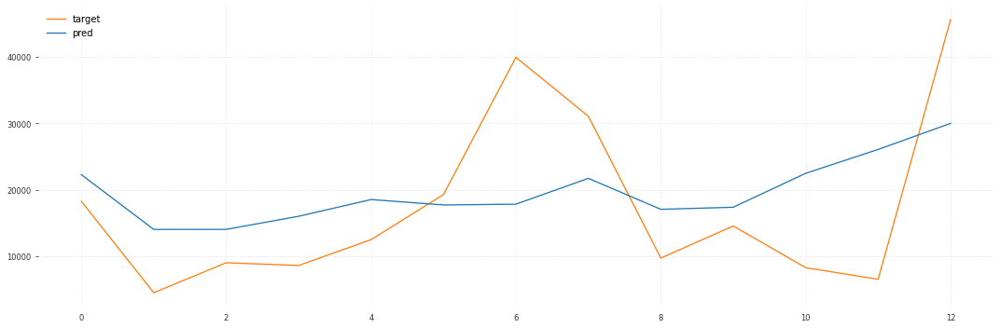

In [491]:
util.plot_rul(10**pred_test[:,2], target_test[:,2], figsize=figsize)